In [1]:
pip install statsmodels

     |████████████████████████████████| 10.8MB 12.6MB/s eta 0:00:01
     |████████████████████████████████| 13.1MB 49.6MB/s eta 0:00:01
     |████████████████████████████████| 38.6MB 49.7MB/s eta 0:00:01██▊                        | 9.3MB 49.7MB/s eta 0:00:01
     |████████████████████████████████| 18.3MB 34.9MB/s eta 0:00:01
     |████████████████████████████████| 61kB 14.0MB/s eta 0:00:01
     |████████████████████████████████| 235kB 50.1MB/s eta 0:00:01
     |████████████████████████████████| 348kB 50.3MB/s eta 0:00:01
     |████████████████████████████████| 235kB 60.4MB/s eta 0:00:01
     |████████████████████████████████| 512kB 44.4MB/s eta 0:00:01
ERROR: openapi-schema-validator 0.6.2 has requirement jsonschema<5.0.0,>=4.19.1, but you'll have jsonschema 4.19.0 which is incompatible.
ERROR: jupyterlab 3.2.4 has requirement jupyter-server~=1.4, but you'll have jupyter-server 2.7.3 which is incompatible.
You should consider upgrading via the 'pip install --upgrade pip' command.
Note:

In [1]:
%matplotlib inline

from __future__ import print_function
from statsmodels.compat import lzip
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
import warnings
warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv('final_data.csv')

In [3]:
data.isnull().sum()


Date                0
Product_ID          0
Selling_Price       0
Cost_Price          0
Competitor_Price    0
Revenue             0
Is_Promotion        0
Unit_Sales          0
category            0
subcategory         0
brand               0
product_name        0
Day_of_Week         0
Month               0
Season              0
Is_Weekend          0
Is_Holiday          0
dtype: int64

Single Variate OLS Regression 

                            OLS Regression Results                            
Dep. Variable:             Unit_Sales   R-squared:                       0.105
Model:                            OLS   Adj. R-squared:                  0.105
Method:                 Least Squares   F-statistic:                     182.3
Date:                Thu, 13 Jun 2024   Prob (F-statistic):           2.28e-39
Time:                        05:14:17   Log-Likelihood:                -10954.
No. Observations:                1552   AIC:                         2.191e+04
Df Residuals:                    1550   BIC:                         2.192e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -1029.7124    152.530     -6.751

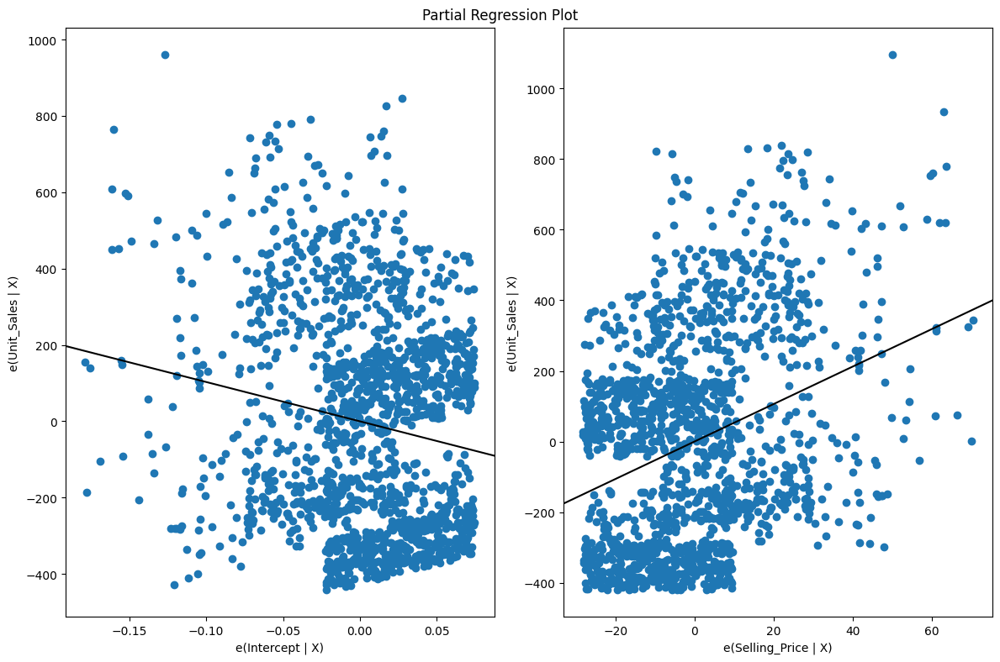

In [8]:
for product_id in data['Product_ID'].unique():
    temp_data = data[data['Product_ID']==product_id]
    data_model = ols("Unit_Sales ~ Selling_Price", data=temp_data).fit()
    print(data_model.summary())
    fig = plt.figure(figsize=(12,8))
    fig = sm.graphics.plot_partregress_grid(data_model, fig=fig)
    break

MULTIVARIATE LINEAR REGRESSION ANALYSIS

Processing Product_Id: 1
                            OLS Regression Results                            
Dep. Variable:             Unit_Sales   R-squared:                       0.704
Model:                            OLS   Adj. R-squared:                  0.703
Method:                 Least Squares   F-statistic:                     736.3
Date:                Thu, 13 Jun 2024   Prob (F-statistic):               0.00
Time:                        05:41:42   Log-Likelihood:                -10095.
No. Observations:                1552   AIC:                         2.020e+04
Df Residuals:                    1546   BIC:                         2.023e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept      

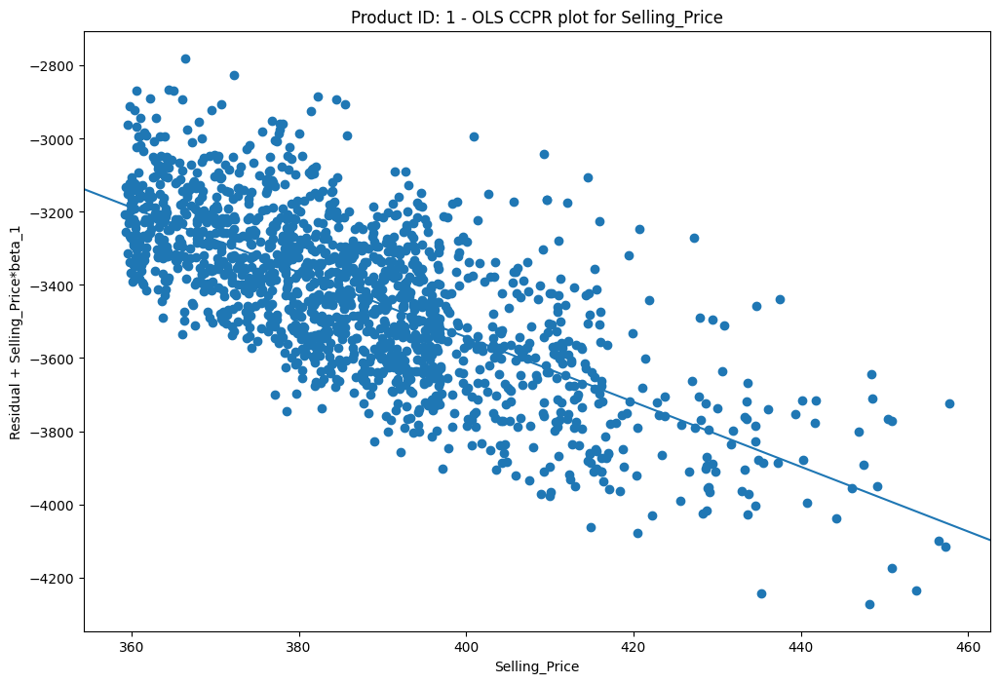

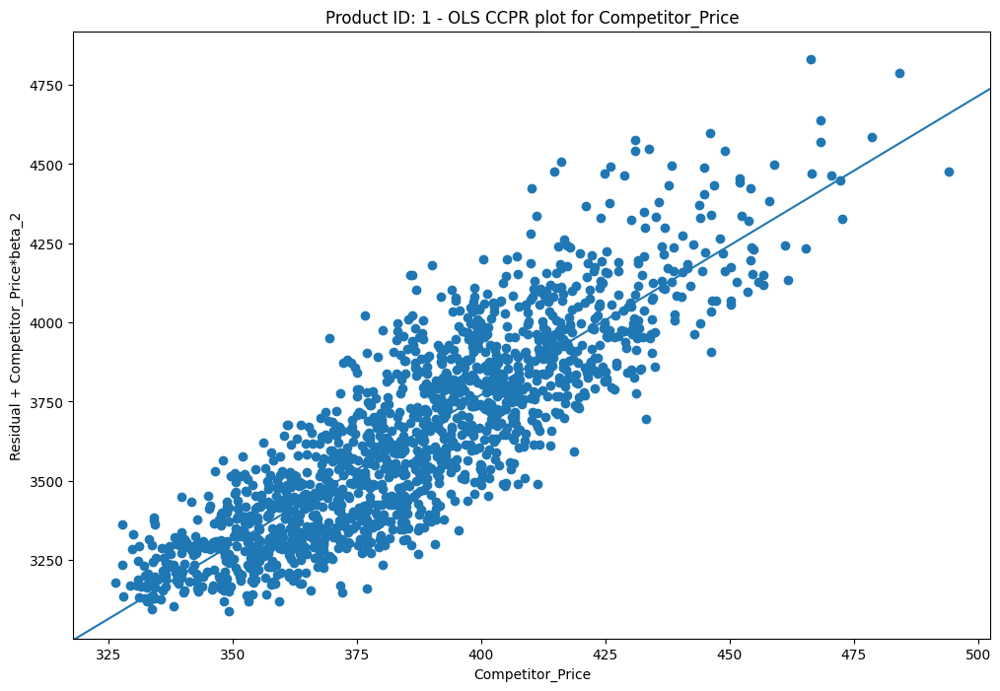

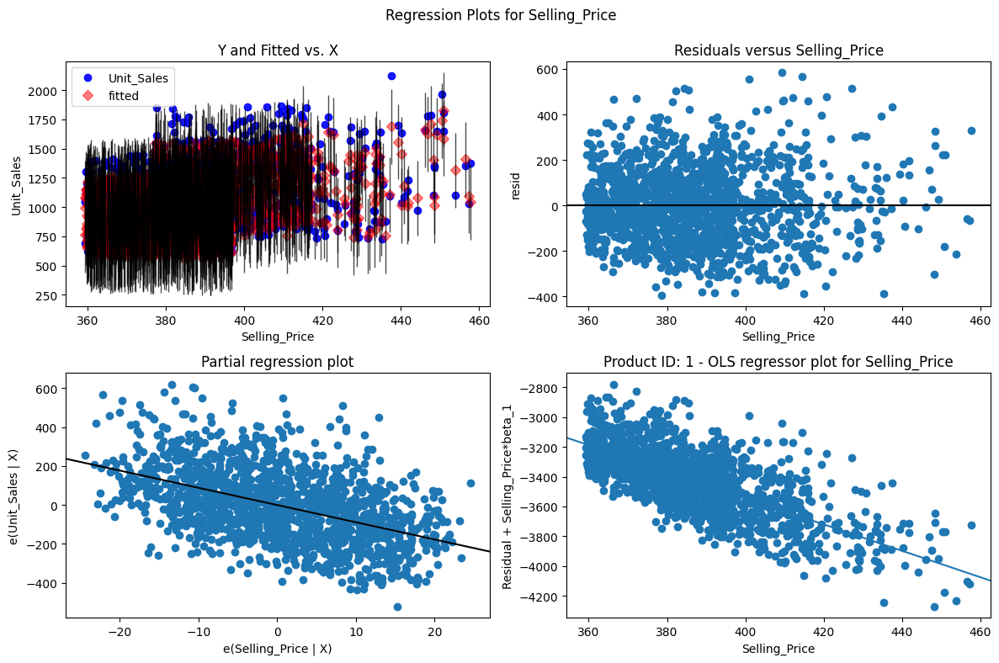

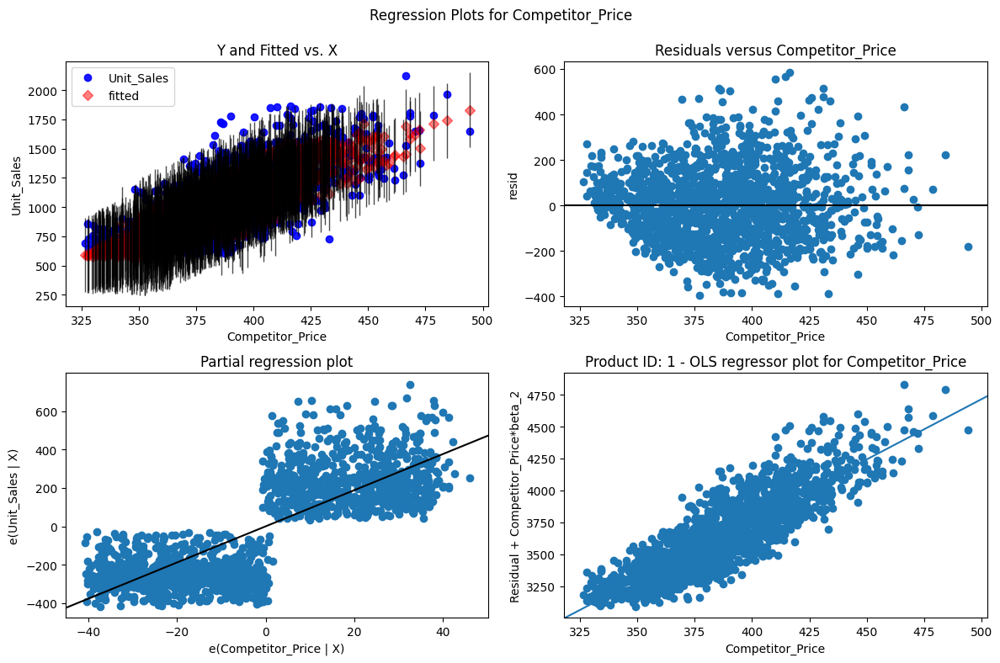

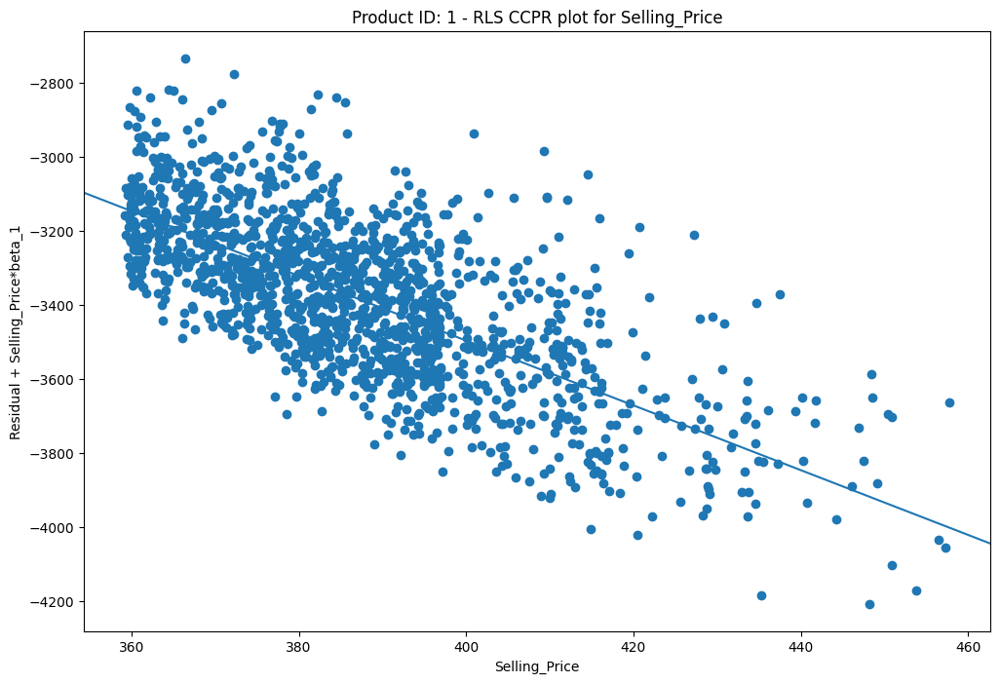

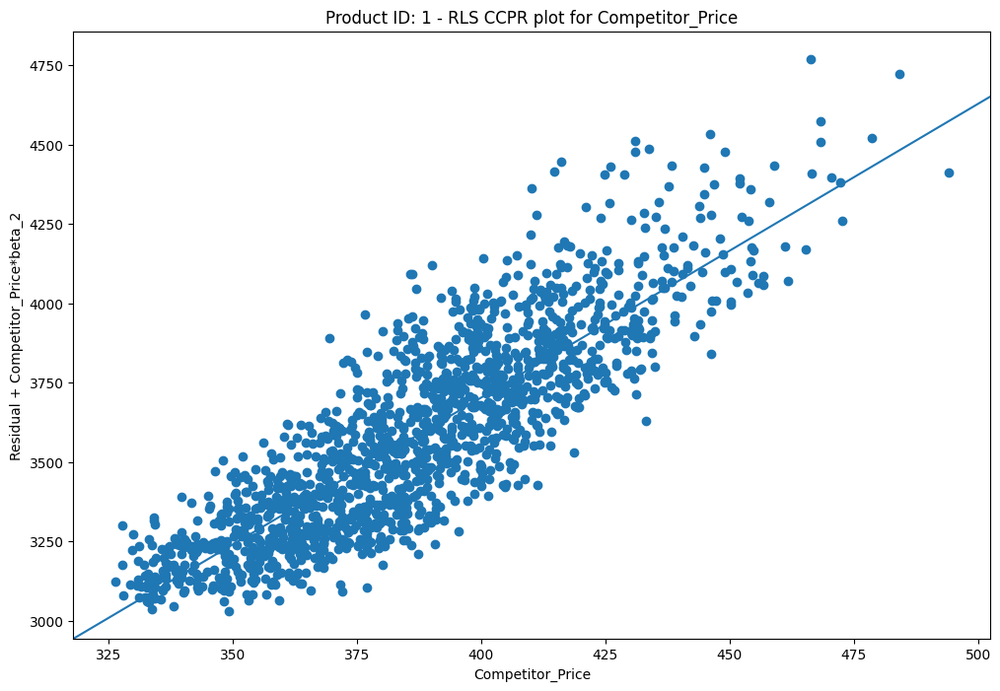

AttributeError: 'RLMResults' object has no attribute 'mse_resid'

<Figure size 1200x800 with 0 Axes>

In [24]:

import pandas as pd

import statsmodels.api as sm

import statsmodels.formula.api as smf

import matplotlib.pyplot as plt

# Load the CSV file

file_path = 'final_data.csv'

data = pd.read_csv(file_path)


# Convert date column to datetime format if it's not already

data['Date'] = pd.to_datetime(data['Date'])

# Sort data by Product_Id and Date

data = data.sort_values(by=['Product_ID', 'Date'])

# Define the regression formula using the desired column naming convention

# Adjust the formula based on your column names and the analysis you want to perform

formula = 'Unit_Sales ~ Selling_Price + Competitor_Price + Is_Weekend + Is_Holiday + Cost_Price'

# Group the data by Product_Id

grouped_data = data.groupby('Product_ID')

# Initialize dictionaries to store models and summaries

ols_models = {}

rls_models = {}

ols_summaries = {}

rls_summaries = {}

# Loop through each product group to perform OLS and RLS estimation

for product_id, group in grouped_data:

    print(f"Processing Product_Id: {product_id}")

    # Perform OLS estimation

    ols_model = smf.ols(formula=formula, data=group).fit()

    ols_models[product_id] = ols_model

    ols_summaries[product_id] = ols_model.summary()
    print(ols_summaries[product_id] )

    # Perform Robust Least Squares (RLS) estimation

    rls_model = smf.rlm(formula=formula, data=group).fit()

    rls_models[product_id] = rls_model

    rls_summaries[product_id] = rls_model.summary()

    # Generate CCPR plots for OLS

    fig, ax = plt.subplots(figsize=(12, 8))

    sm.graphics.plot_ccpr(ols_model, 'Selling_Price', ax=ax)

    plt.title(f"Product ID: {product_id} - OLS CCPR plot for Selling_Price")

    plt.show()

    fig, ax = plt.subplots(figsize=(12, 8))

    sm.graphics.plot_ccpr(ols_model, 'Competitor_Price', ax=ax)

    plt.title(f"Product ID: {product_id} - OLS CCPR plot for Competitor_Price")

    plt.show()

    # Generate regressor plots for OLS

    fig = plt.figure(figsize=(12, 8))

    fig = sm.graphics.plot_regress_exog(ols_model, 'Selling_Price', fig=fig)

    plt.title(f"Product ID: {product_id} - OLS regressor plot for Selling_Price")

    plt.show()

    fig = plt.figure(figsize=(12, 8))

    fig = sm.graphics.plot_regress_exog(ols_model, 'Competitor_Price', fig=fig)

    plt.title(f"Product ID: {product_id} - OLS regressor plot for Competitor_Price")

    plt.show()

    # Generate CCPR plots for RLS

    fig, ax = plt.subplots(figsize=(12, 8))

    sm.graphics.plot_ccpr(rls_model, 'Selling_Price', ax=ax)

    plt.title(f"Product ID: {product_id} - RLS CCPR plot for Selling_Price")

    plt.show()

    fig, ax = plt.subplots(figsize=(12, 8))

    sm.graphics.plot_ccpr(rls_model, 'Competitor_Price', ax=ax)

    plt.title(f"Product ID: {product_id} - RLS CCPR plot for Competitor_Price")

    plt.show()

    # Generate regressor plots for RLS

    fig = plt.figure(figsize=(12, 8))

    fig = sm.graphics.plot_regress_exog(rls_model, 'Selling_Price', fig=fig)

    plt.title(f"Product ID: {product_id} - RLS regressor plot for Selling_Price")

    plt.show()

    fig = plt.figure(figsize=(12, 8))

    fig = sm.graphics.plot_regress_exog(rls_model, 'Competitor_Price', fig=fig)

    plt.title(f"Product ID: {product_id} - RLS regressor plot for Competitor_Price")

    plt.show()

# Optional: Display the summaries for all products

for product_id, summary in ols_summaries.items():

    print(f"\nOLS Summary for Product_Id {product_id}:\n", summary)

for product_id, summary in rls_summaries.items():

    print(f"\nRLS Summary for Product_Id {product_id}:\n", summary)

POLYNOMIAL REGRESSION  MODEL

In [27]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
import statsmodels.api as sm
import matplotlib.pyplot as plt
# Load the CSV file
file_path = 'final_data.csv'
data = pd.read_csv(file_path)

# Convert date column to datetime format if it's not already
data['Date'] = pd.to_datetime(data['Date'])
# Sort data by Product_Id and Date
data = data.sort_values(by=['Product_ID', 'Date'])
# Define the predictors and the target variable
predictors = ['Selling_Price', 'Competitor_Price', 'Is_Weekend', 'Is_Holiday', 'Cost_Price']
target = 'Unit_Sales'
# Group the data by Product_Id
grouped_data = data.groupby('Product_ID')
# Initialize dictionaries to store models and summaries
poly_models = {}
poly_summaries = {}
# Loop through each product group to perform polynomial regression
for product_id, group in grouped_data:
   print(f"Processing Product_Id: {product_id}")
   # Extract the predictors and target variable
   X = group[predictors]
   y = group[target]
   # Generate polynomial features
   poly = PolynomialFeatures(degree=2, include_bias=False)
   X_poly = poly.fit_transform(X)
   # Fit the polynomial regression model using statsmodels
   X_poly = sm.add_constant(X_poly)  # Add an intercept term
   poly_model = sm.OLS(y, X_poly).fit()
   poly_models[product_id] = poly_model
   poly_summaries[product_id] = poly_model.summary()
   # Print the summary for each product (optional)
   print(f"\nPolynomial Regression Summary for Product_Id {product_id}:\n", poly_model.summary())
   break
   # Generate CCPR plots (for simplicity, let's just use the linear terms)
for predictor in predictors:
    if predictor in poly_model.params.index:
        fig, ax = plt.subplots(figsize=(12, 8))
        sm.graphics.plot_ccpr(poly_model, predictor, ax=ax)
        plt.title(f"Product ID: {product_id} - CCPR plot for {predictor}")
        plt.show()
   # Generate regressor plots (for simplicity, let's just use the linear terms)
for predictor in predictors:
    if predictor in poly_model.params.index:
        fig = plt.figure(figsize=(12, 8))
        fig = sm.graphics.plot_regress_exog(poly_model, predictor, fig=fig)
        plt.title(f"Product ID: {product_id} - Regressor plot for {predictor}")
        plt.show()



Processing Product_Id: 1

Polynomial Regression Summary for Product_Id 1:
                             OLS Regression Results                            
Dep. Variable:             Unit_Sales   R-squared:                       0.711
Model:                            OLS   Adj. R-squared:                  0.708
Method:                 Least Squares   F-statistic:                     209.7
Date:                Thu, 13 Jun 2024   Prob (F-statistic):               0.00
Time:                        05:48:26   Log-Likelihood:                -10077.
No. Observations:                1552   AIC:                         2.019e+04
Df Residuals:                    1533   BIC:                         2.029e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [28]:
poly_model.params.index

Index(['const', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10',
       'x11', 'x12', 'x13', 'x14', 'x15', 'x16', 'x17', 'x18', 'x19', 'x20'],
      dtype='object')

         Date  Product_ID  Selling_Price  Cost_Price  Competitor_Price  \
0  2020-01-01           1     361.072475  205.136907        364.659924   
1  2020-01-01           2      42.896200   36.296394         43.856067   
2  2020-01-01           3      49.305021   25.475475         52.902257   
3  2020-01-01           4     192.328490  146.093738        203.120787   
4  2020-01-01           5     463.593618  258.965427        424.871669   

         Revenue  Is_Promotion  Unit_Sales   category    subcategory  \
0  770167.588372             0        1134     Bakery          Bread   
1  170555.291205             0         859     Bakery          Cakes   
2  113598.767491             0         558  Beverages    Soft Drinks   
3  244257.182620             0         326   Cleaning          Wipes   
4  543331.720858             0         209   Cleaning  Disinfectants   

        brand              product_name Day_of_Week    Month  Season  \
0  GoldenLoaf          GoldenLoaf Bread   Wednesda

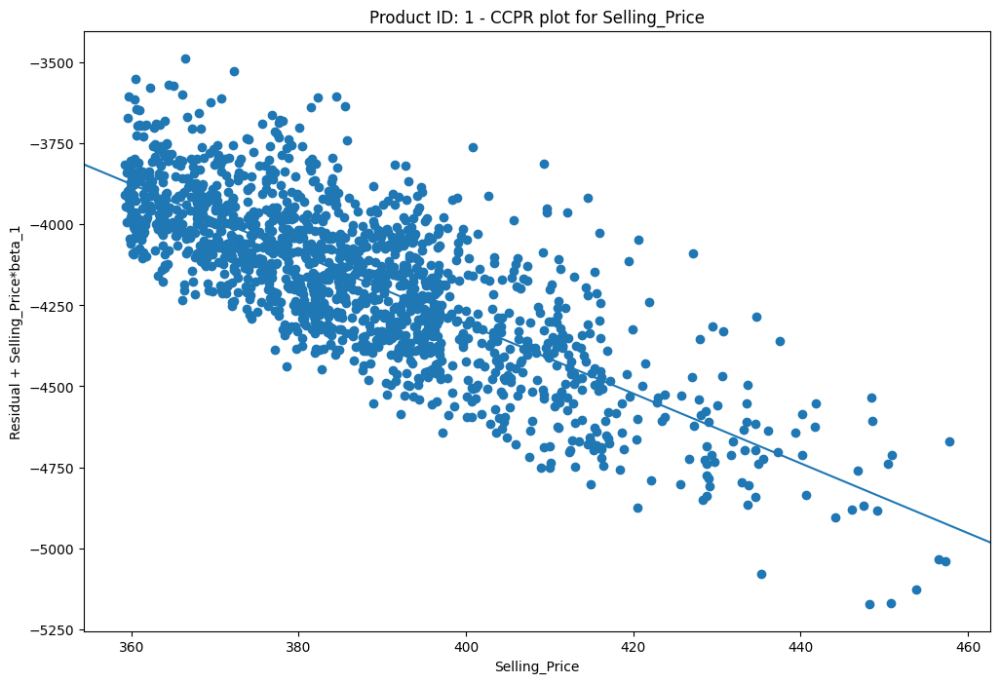

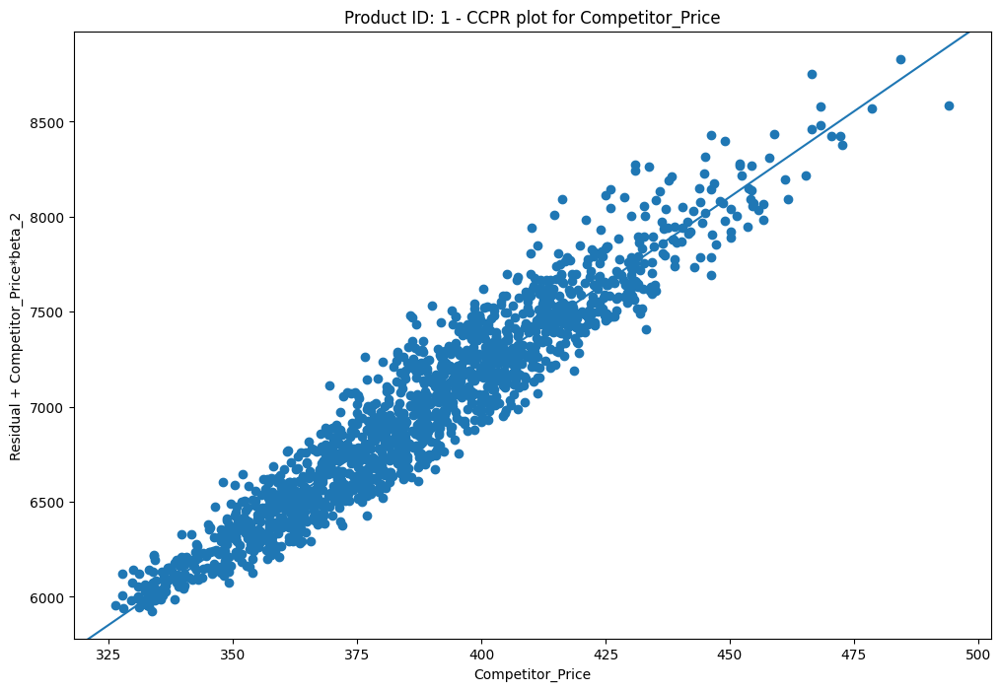

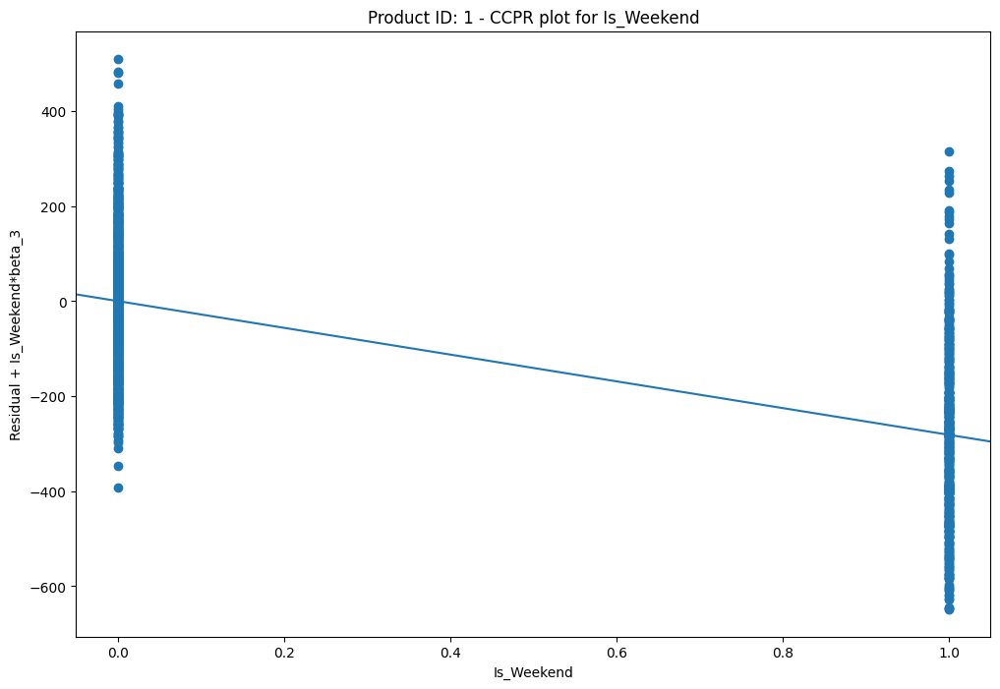

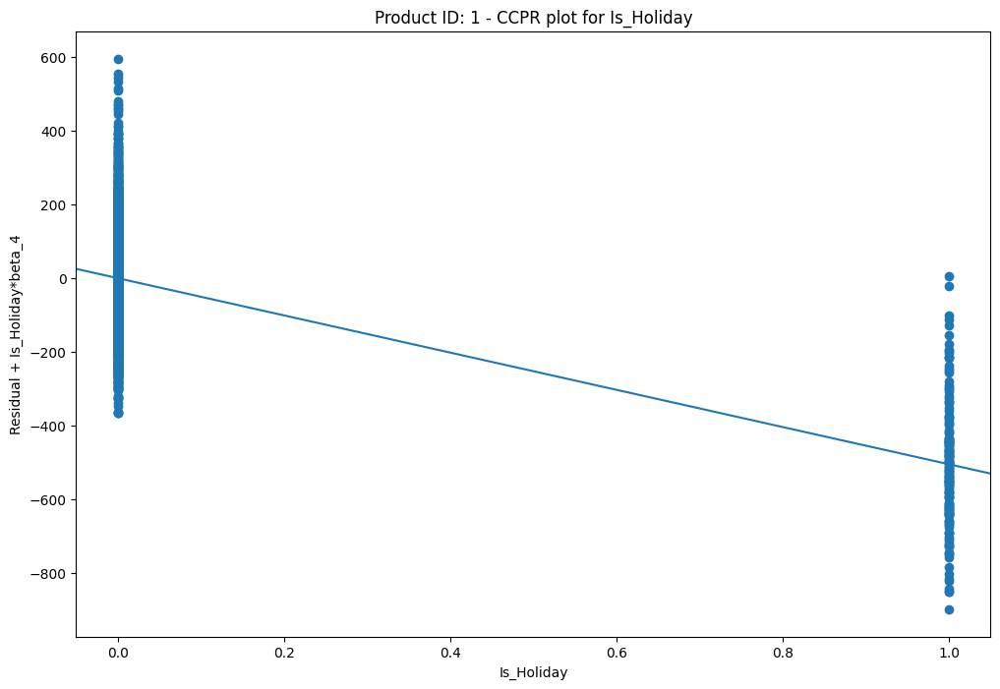

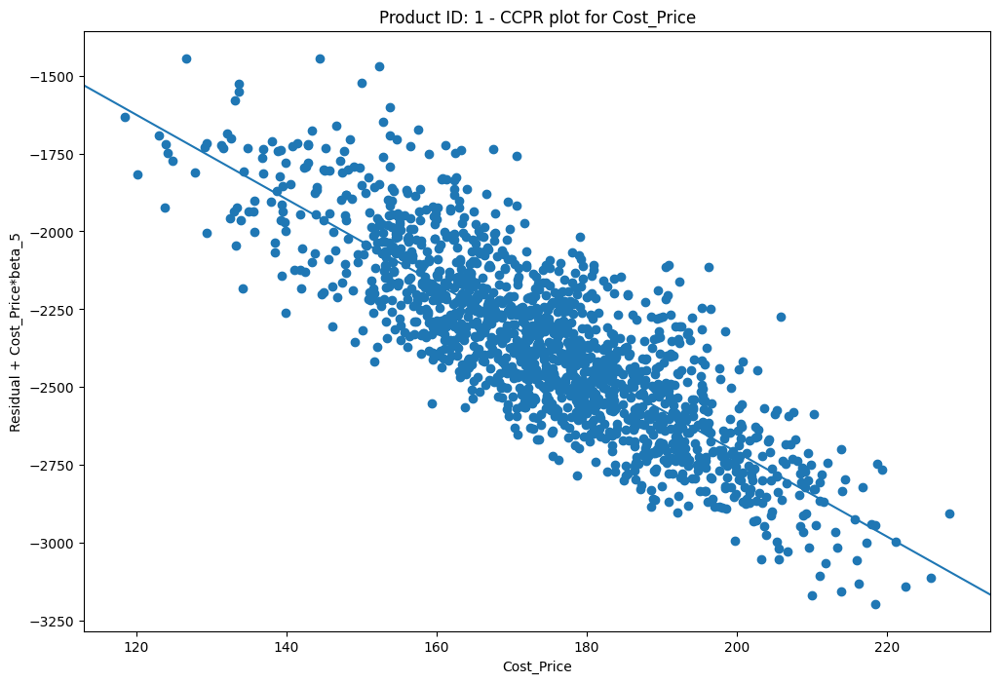

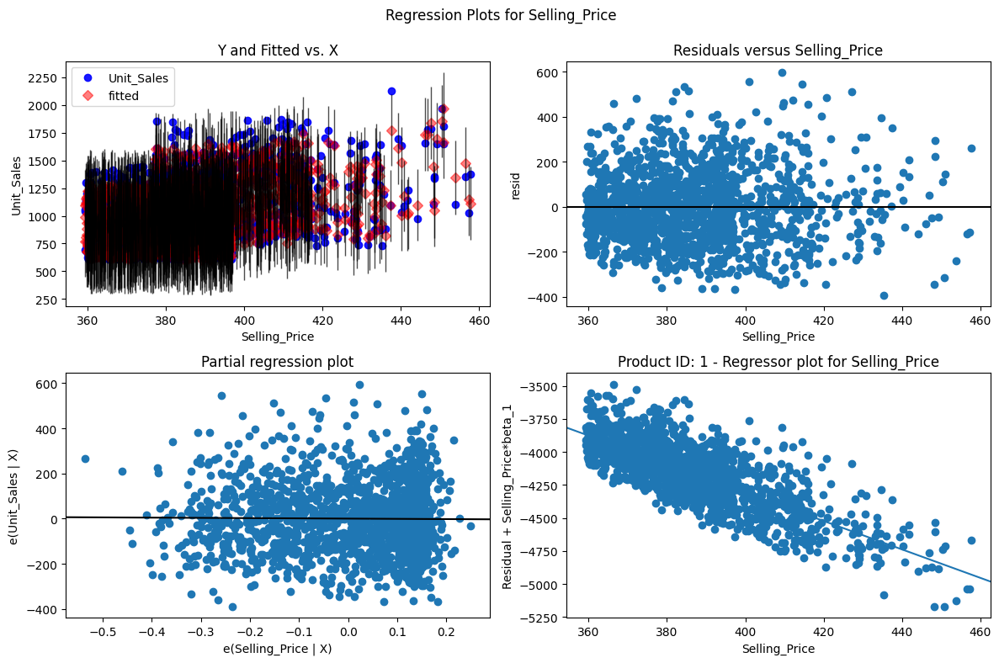

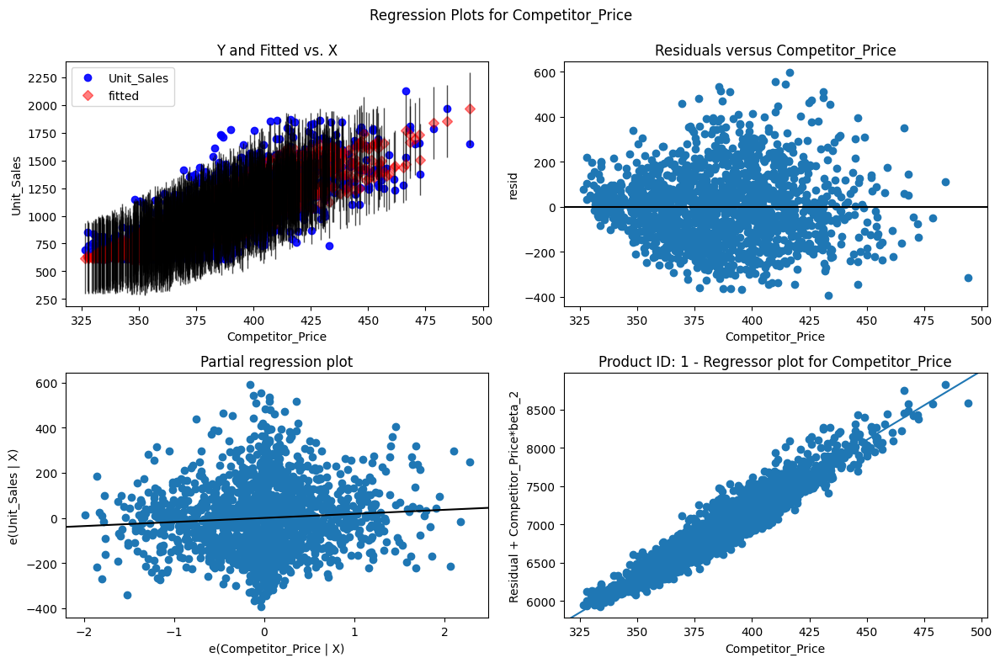

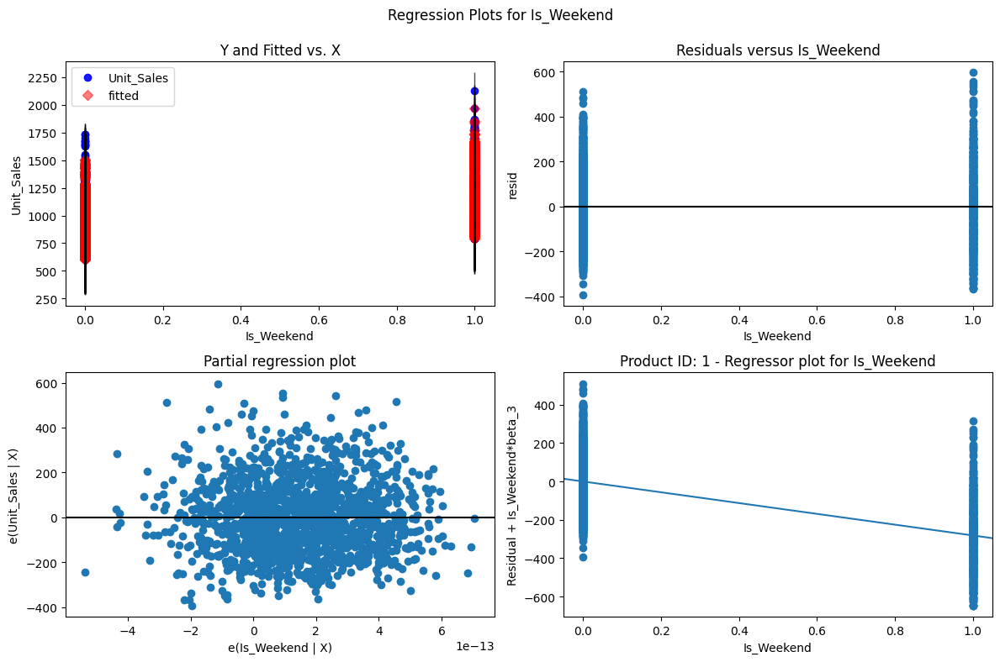

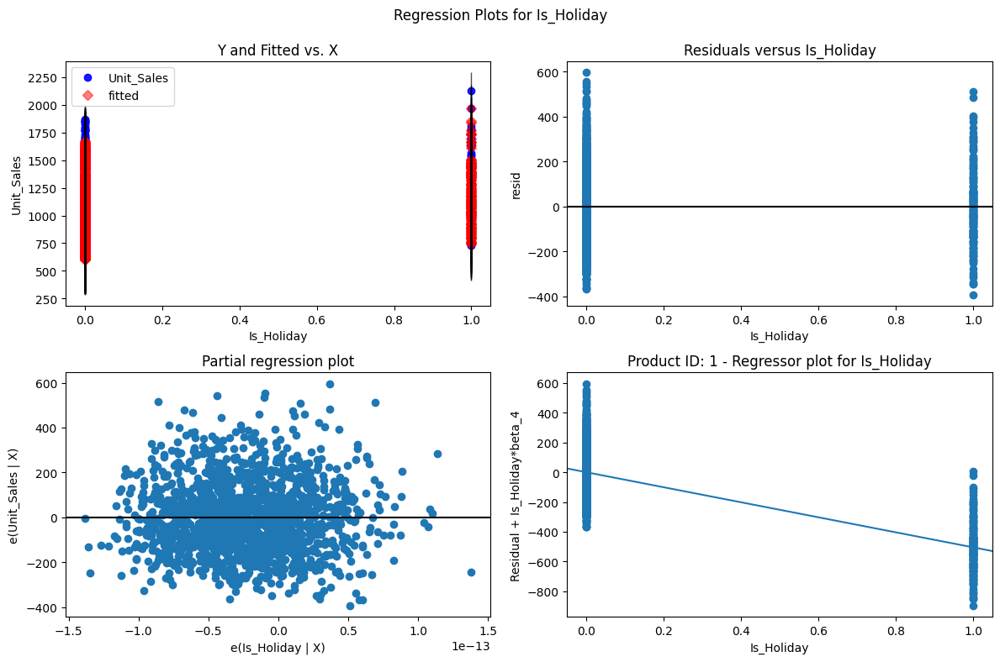

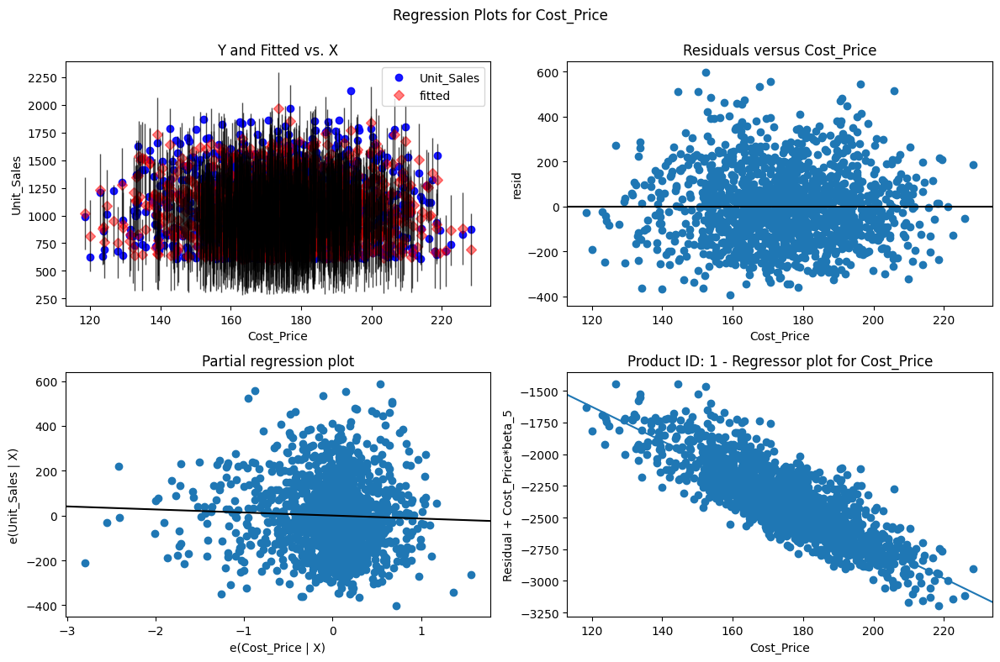

Processing Product_Id: 2

Polynomial Regression Summary for Product_Id 2:
                             OLS Regression Results                            
Dep. Variable:             Unit_Sales   R-squared:                       0.700
Model:                            OLS   Adj. R-squared:                  0.697
Method:                 Least Squares   F-statistic:                     199.1
Date:                Thu, 13 Jun 2024   Prob (F-statistic):               0.00
Time:                        05:53:04   Log-Likelihood:                -9751.0
No. Observations:                1552   AIC:                         1.954e+04
Df Residuals:                    1533   BIC:                         1.964e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

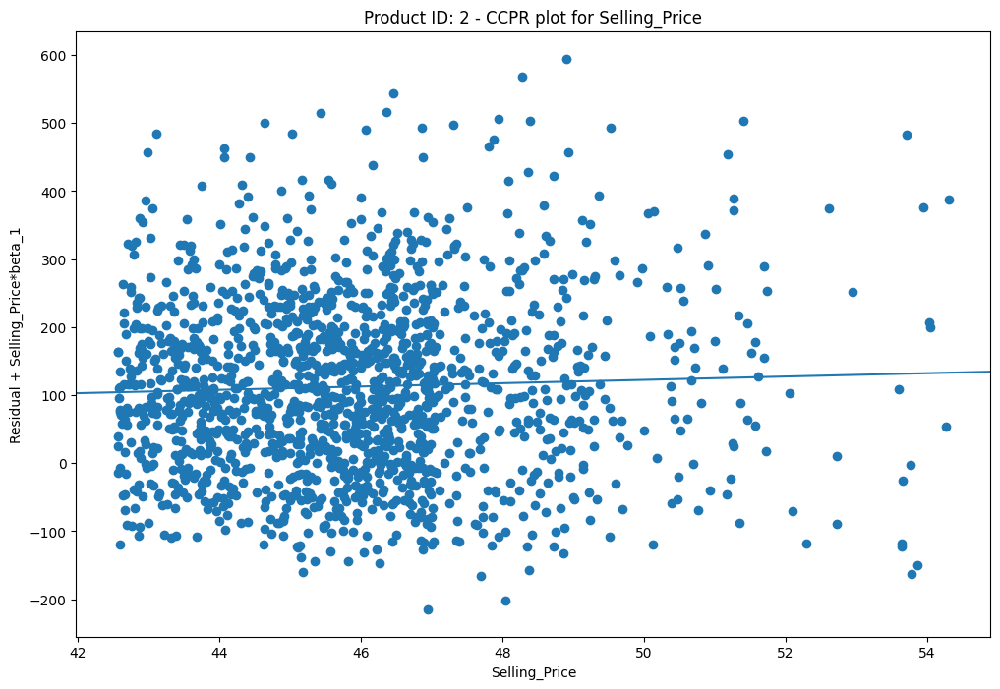

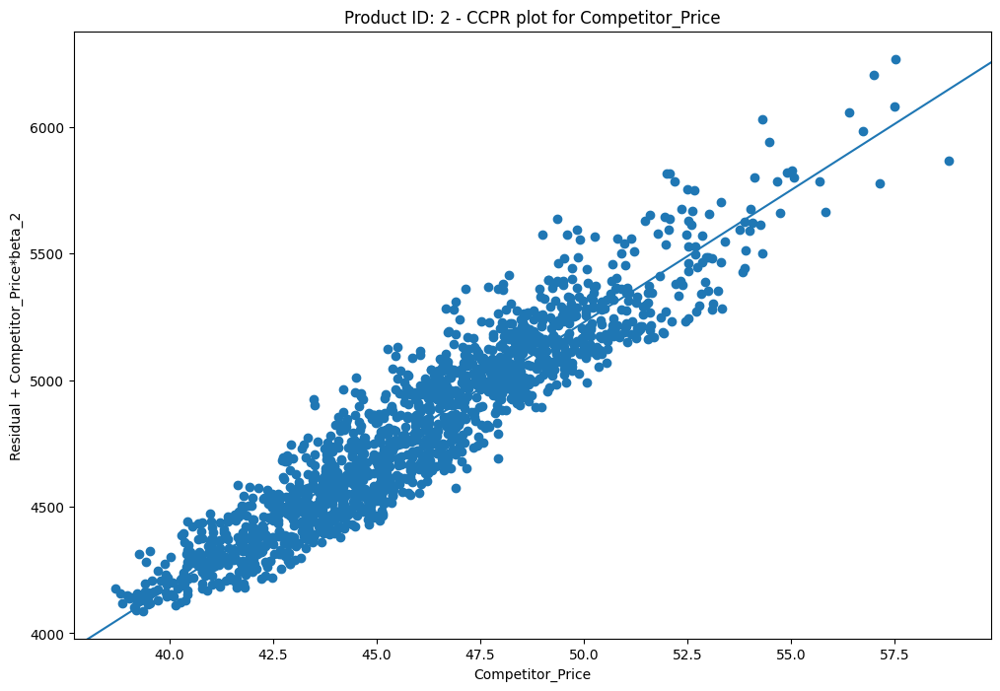

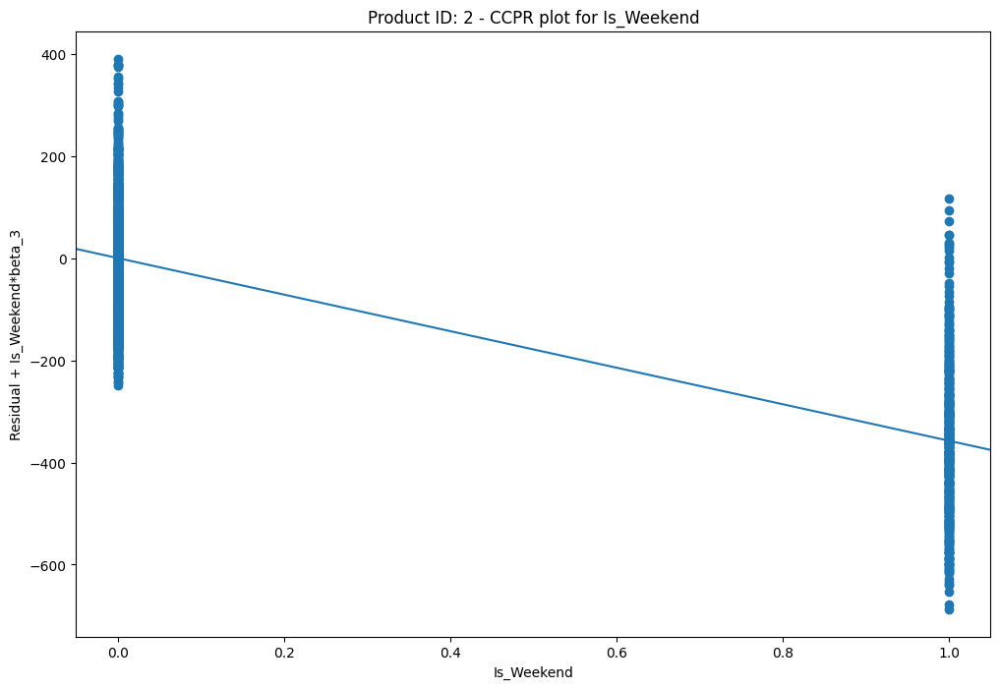

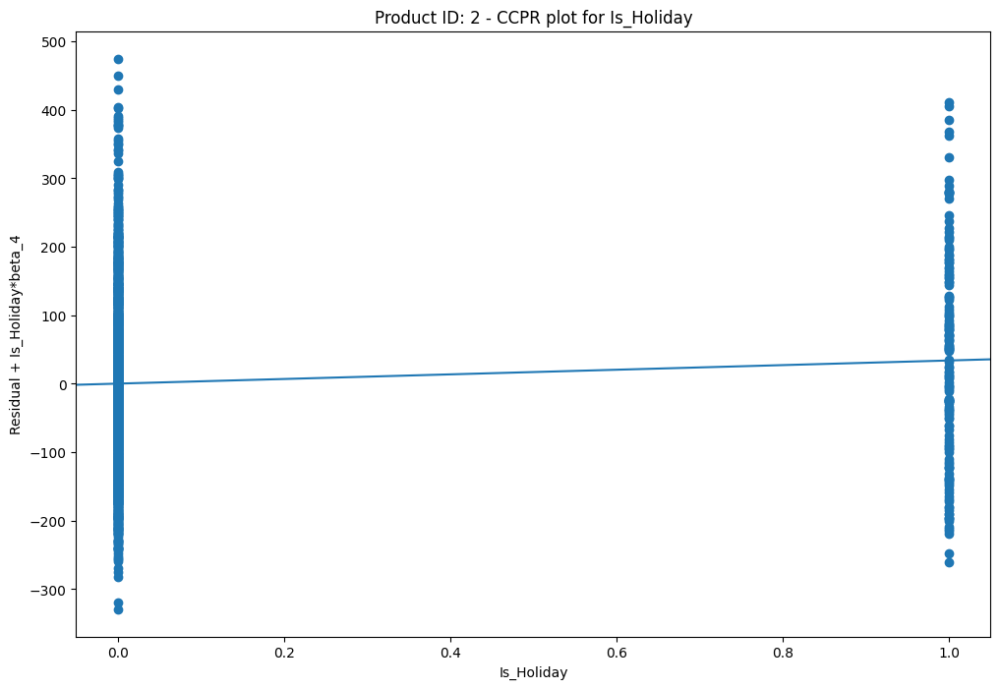

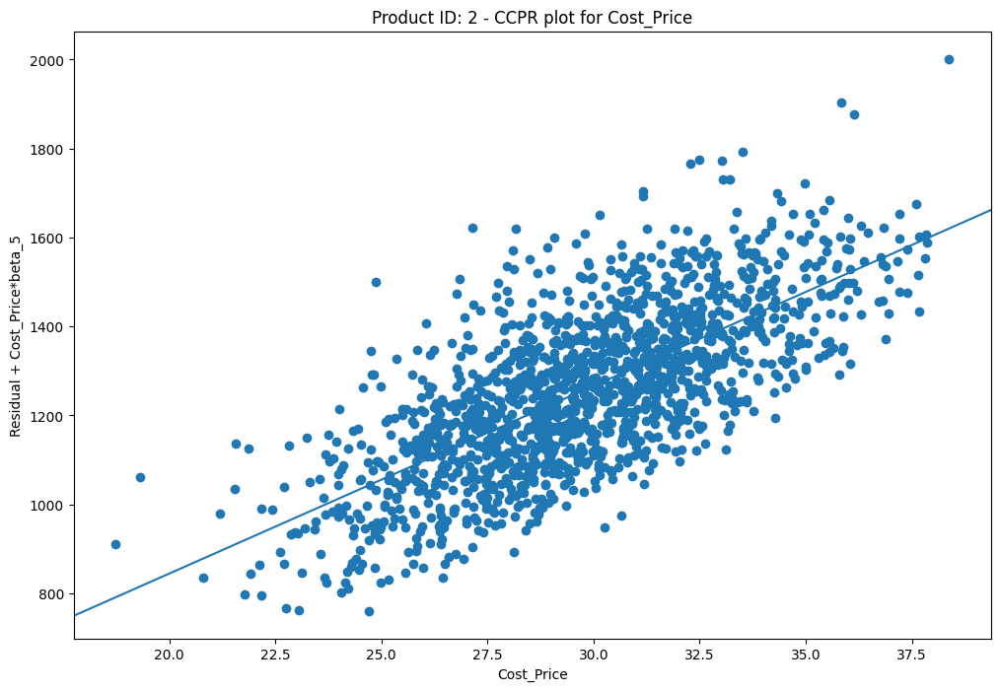

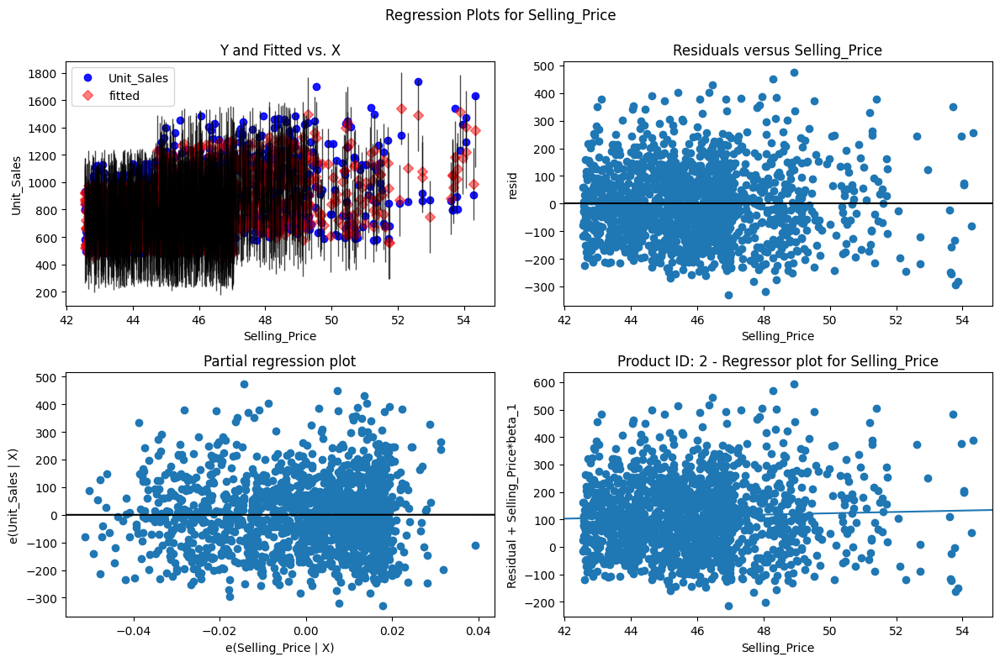

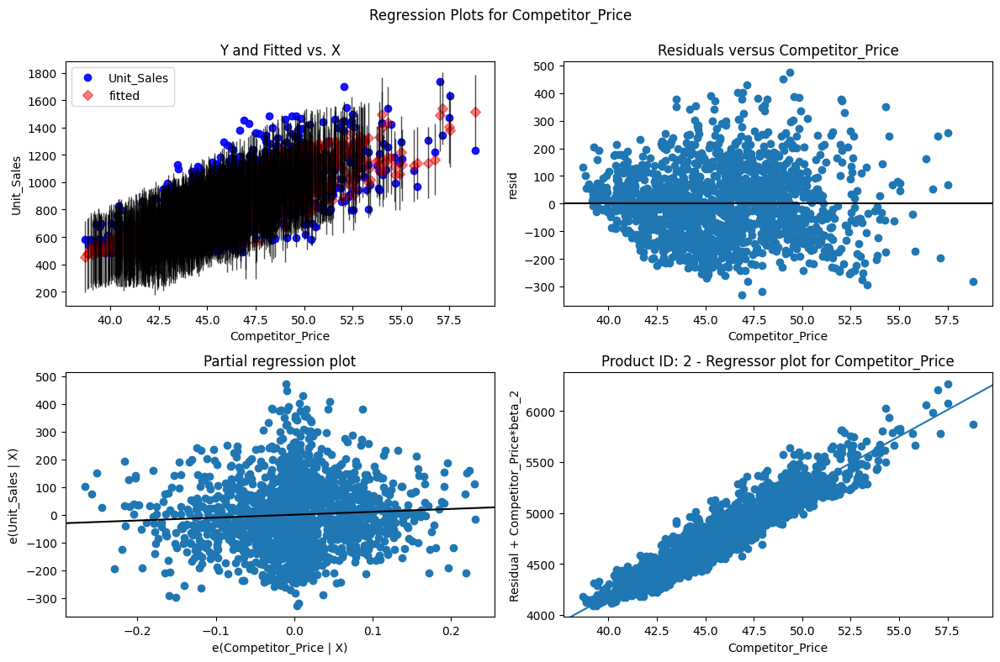

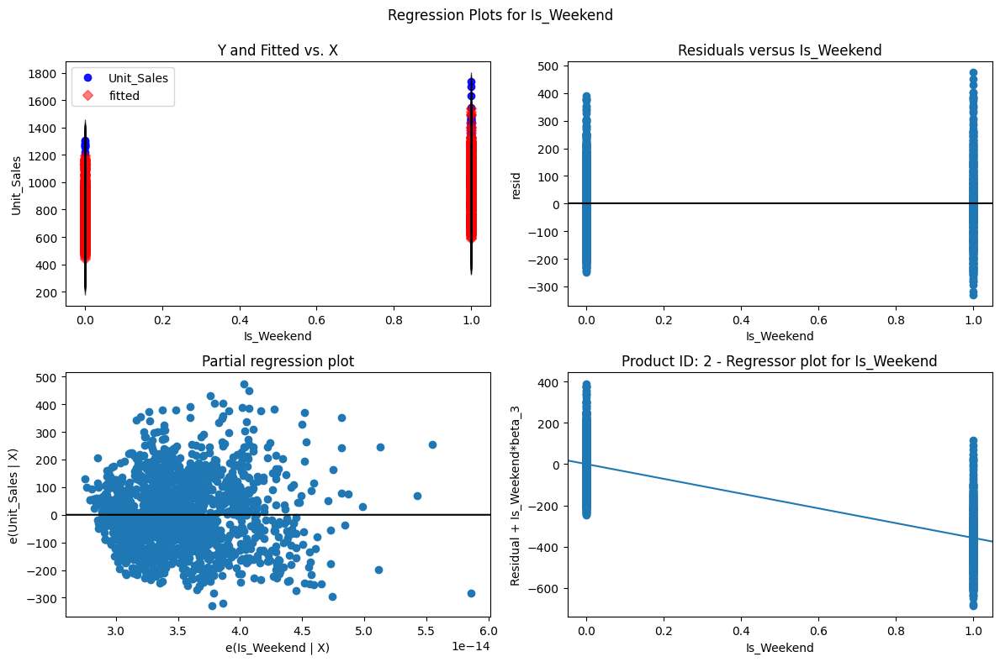

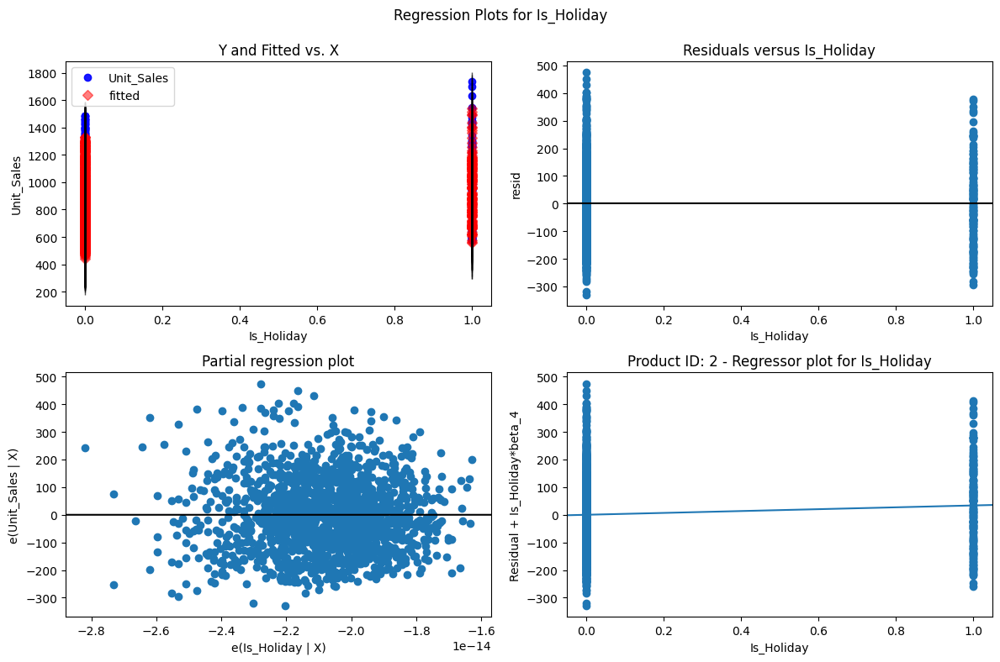

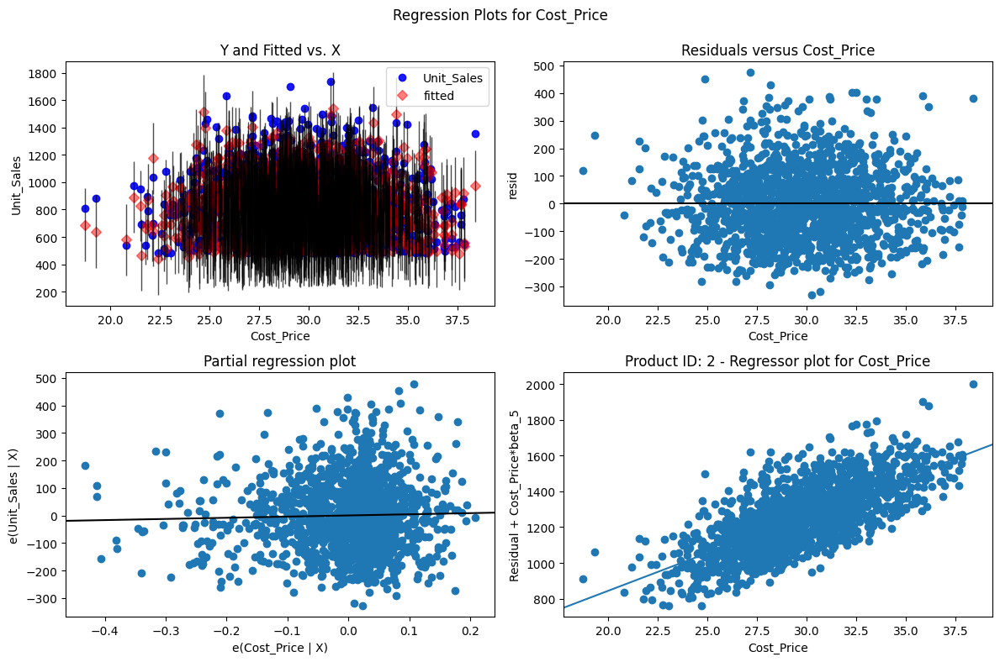

Processing Product_Id: 3

Polynomial Regression Summary for Product_Id 3:
                             OLS Regression Results                            
Dep. Variable:             Unit_Sales   R-squared:                       0.712
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     210.8
Date:                Thu, 13 Jun 2024   Prob (F-statistic):               0.00
Time:                        05:53:11   Log-Likelihood:                -8908.4
No. Observations:                1552   AIC:                         1.785e+04
Df Residuals:                    1533   BIC:                         1.796e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

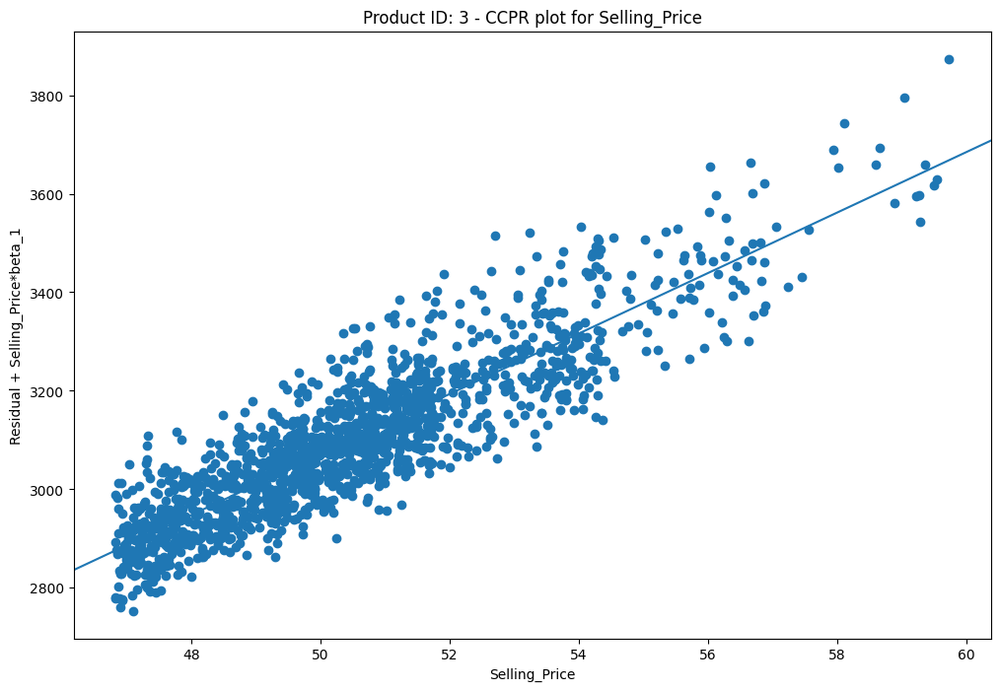

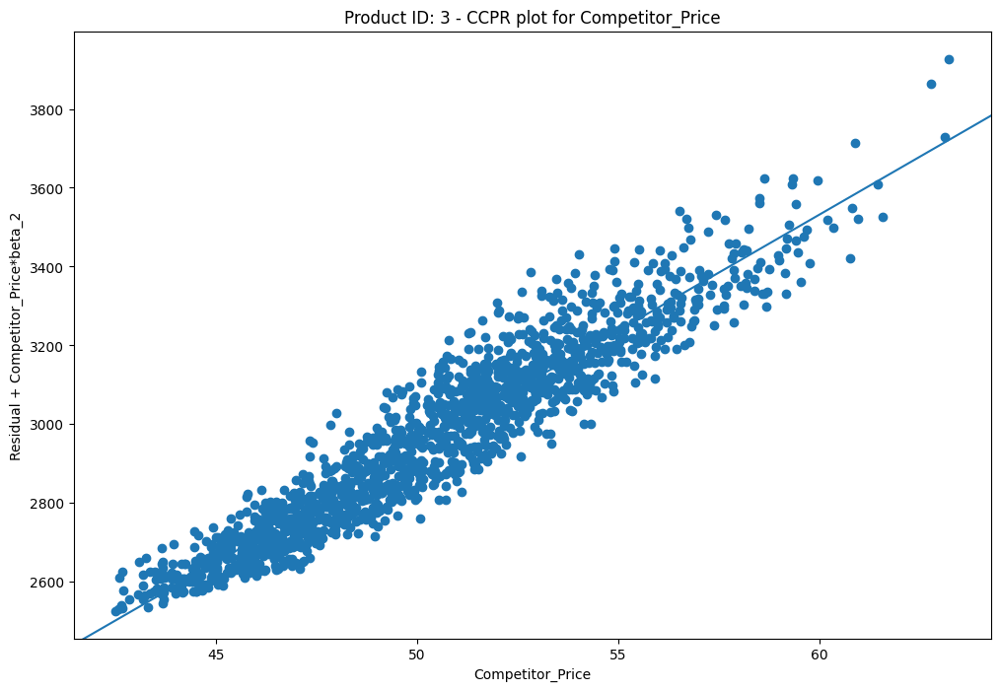

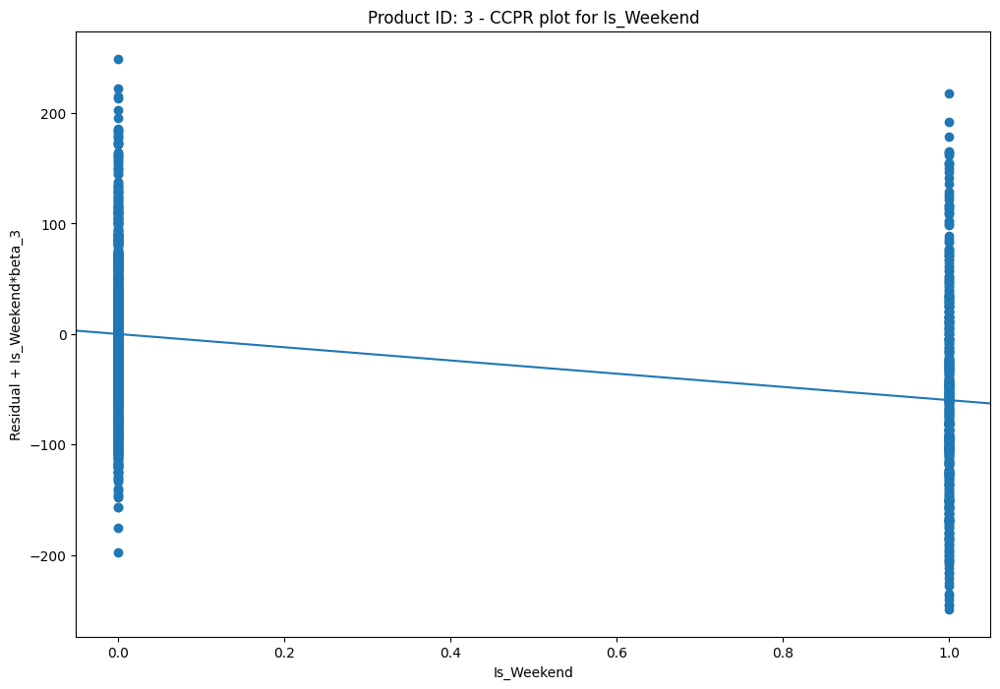

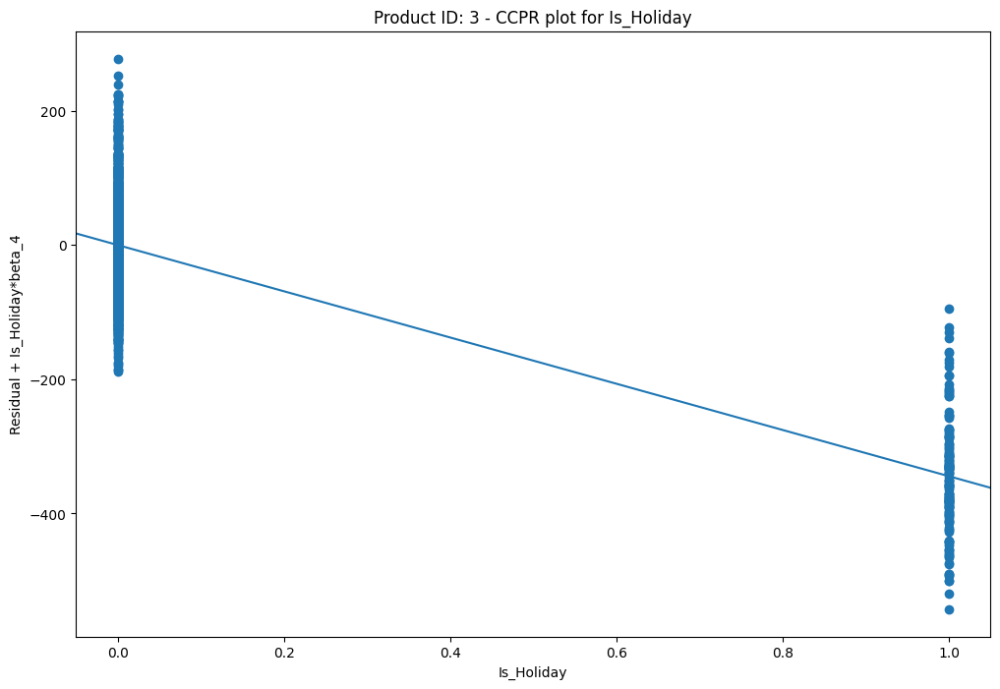

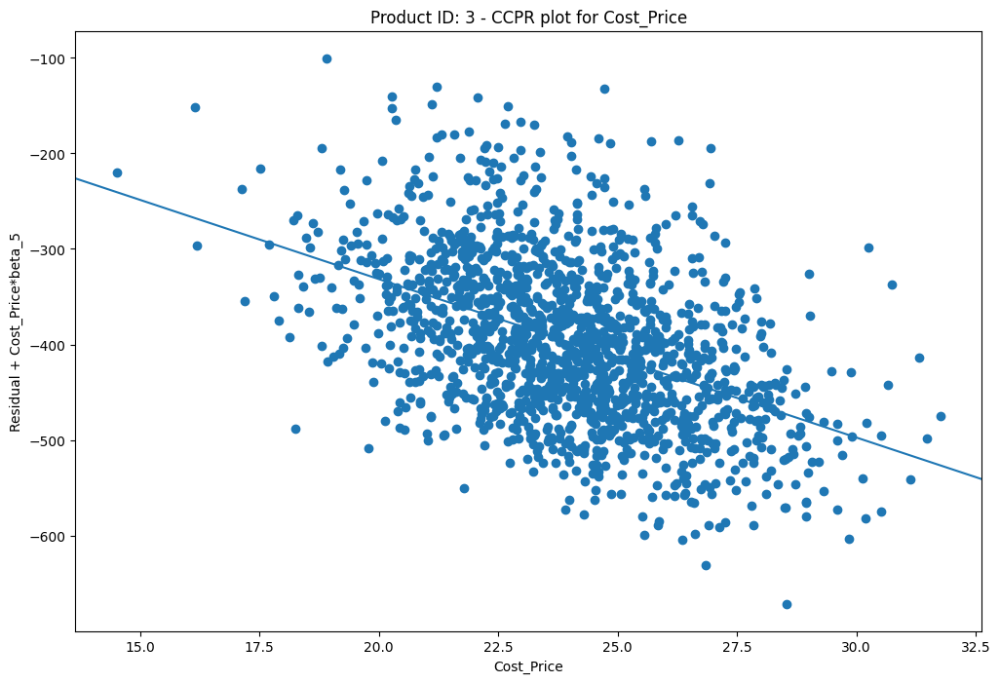

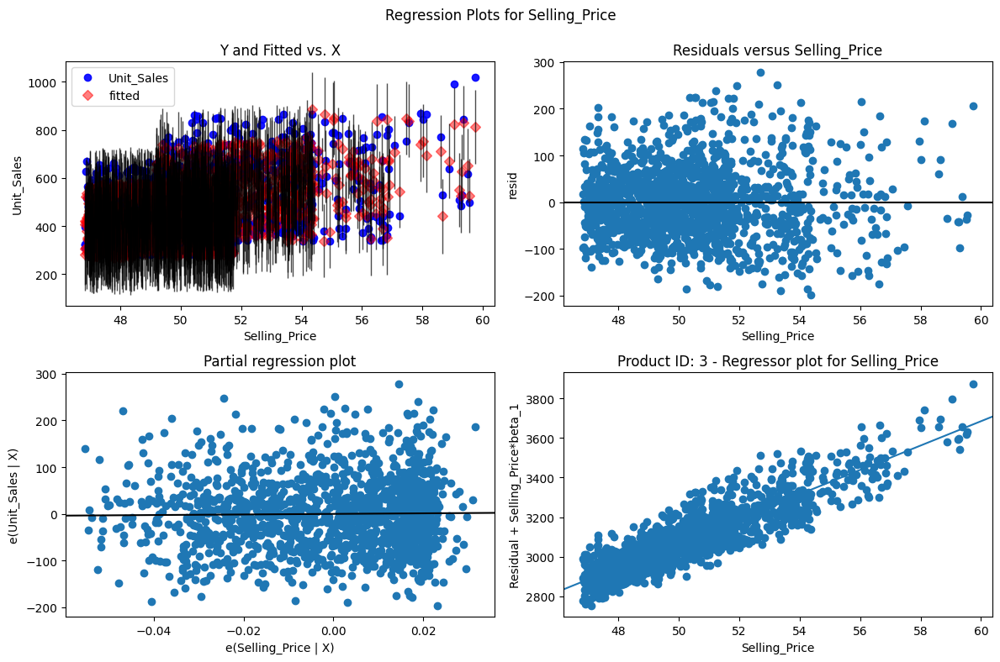

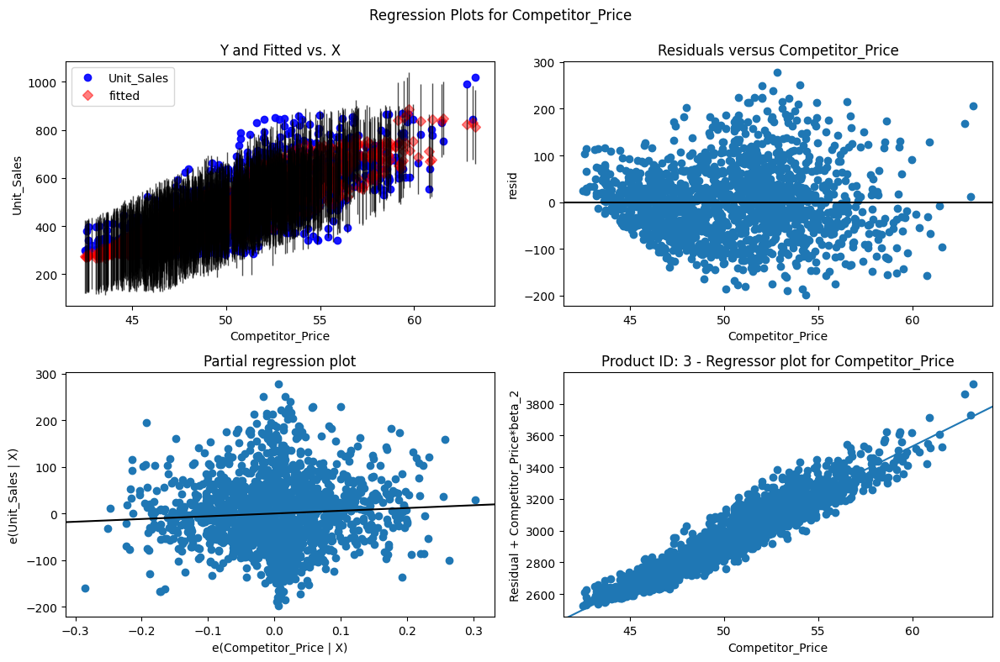

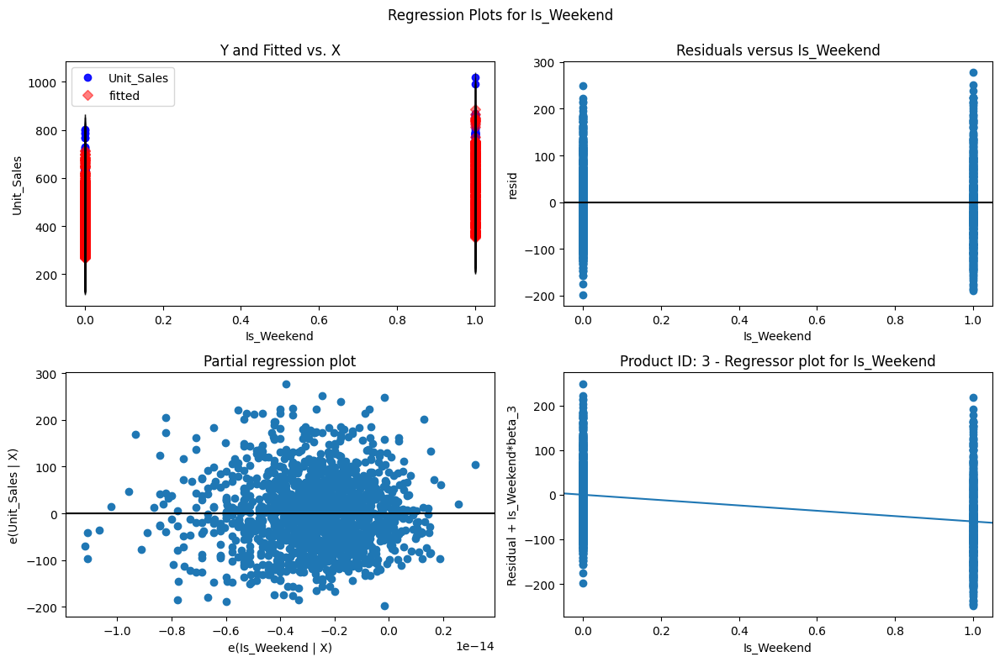

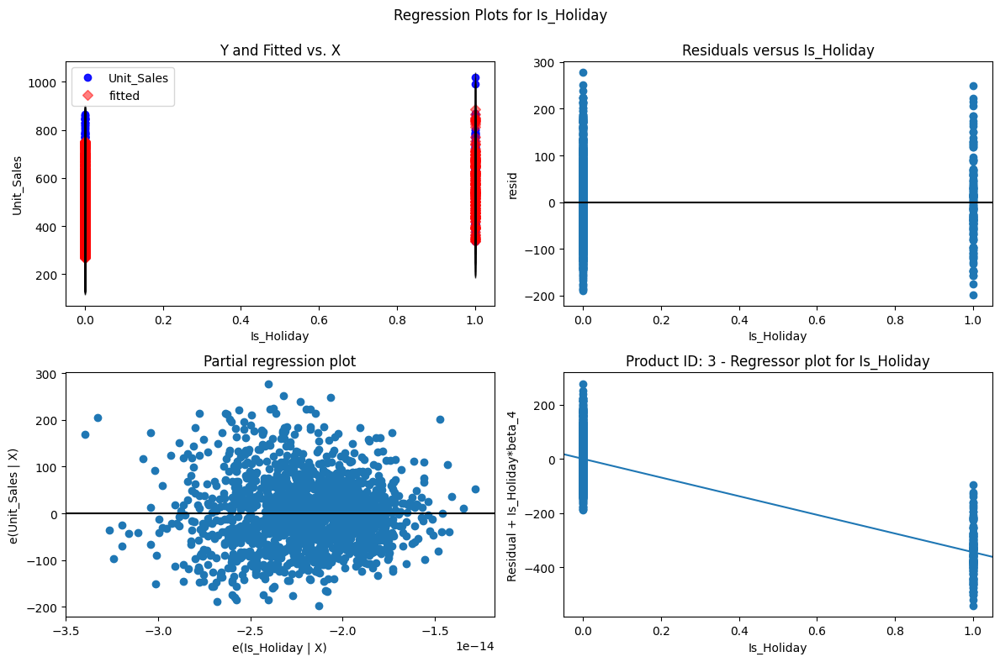

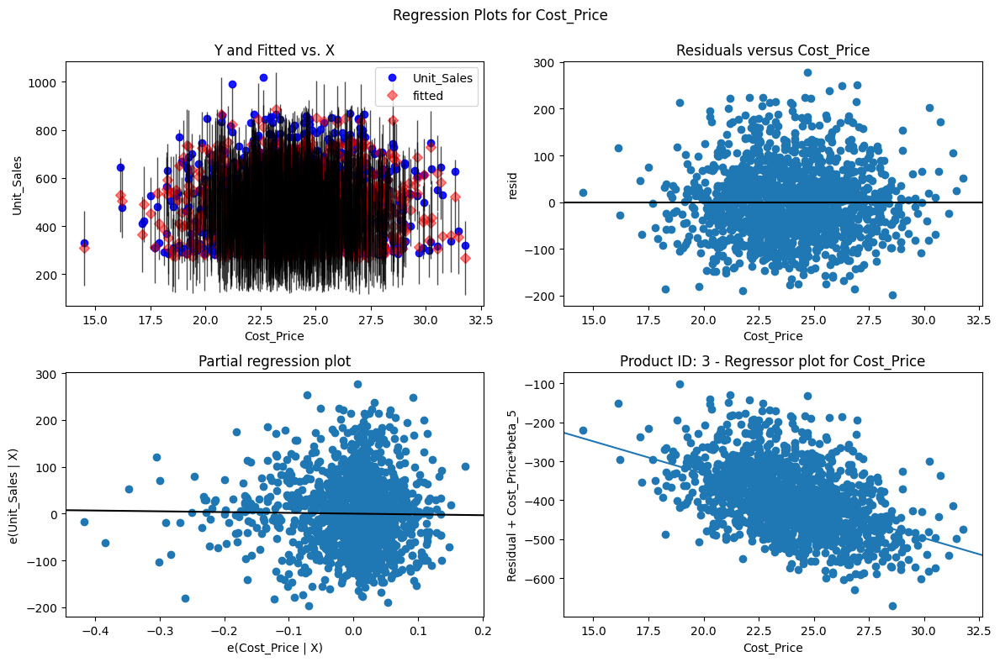

Processing Product_Id: 4

Polynomial Regression Summary for Product_Id 4:
                             OLS Regression Results                            
Dep. Variable:             Unit_Sales   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.710
Method:                 Least Squares   F-statistic:                     212.0
Date:                Thu, 13 Jun 2024   Prob (F-statistic):               0.00
Time:                        05:53:18   Log-Likelihood:                -8205.1
No. Observations:                1552   AIC:                         1.645e+04
Df Residuals:                    1533   BIC:                         1.655e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

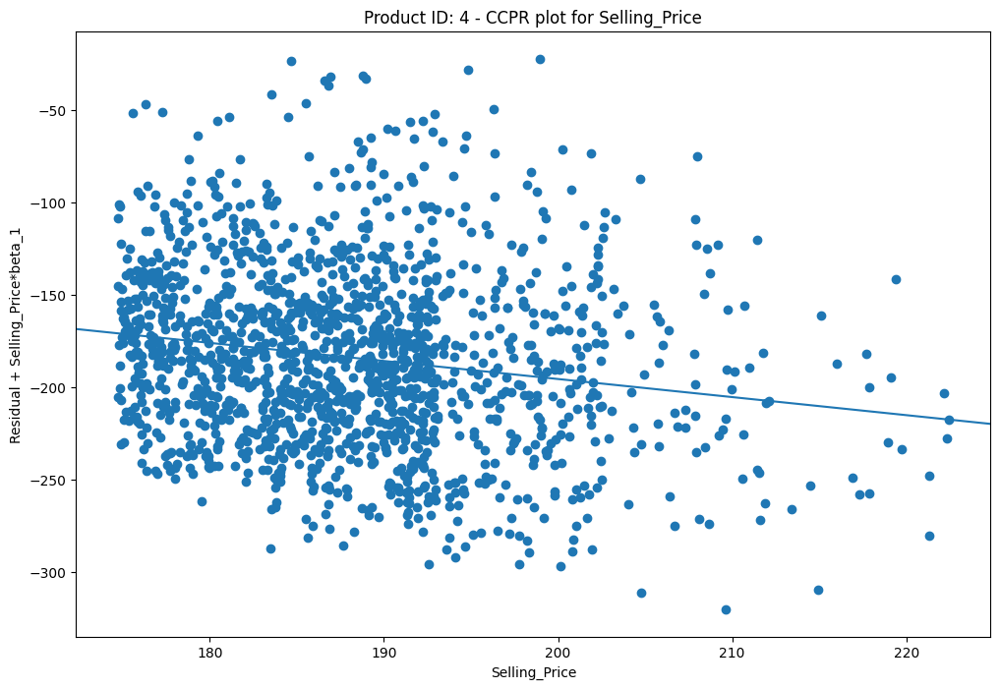

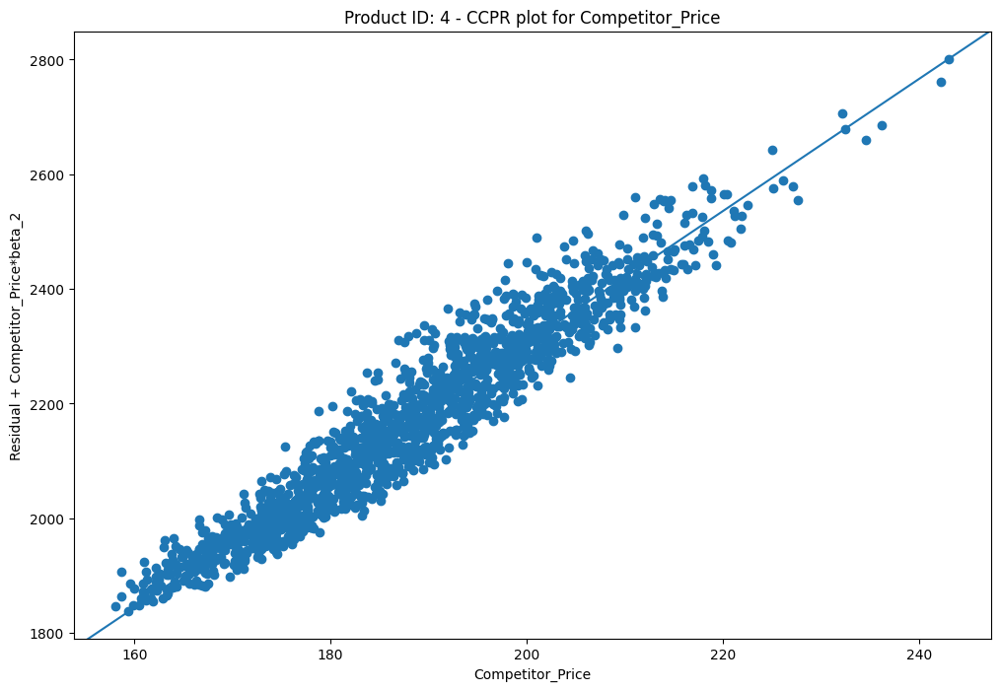

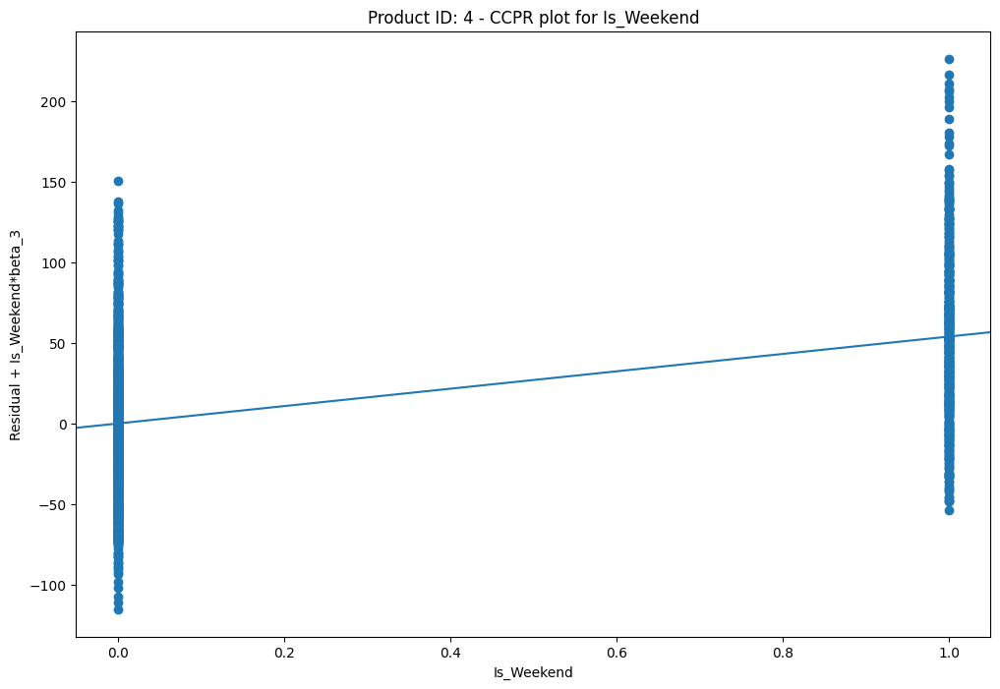

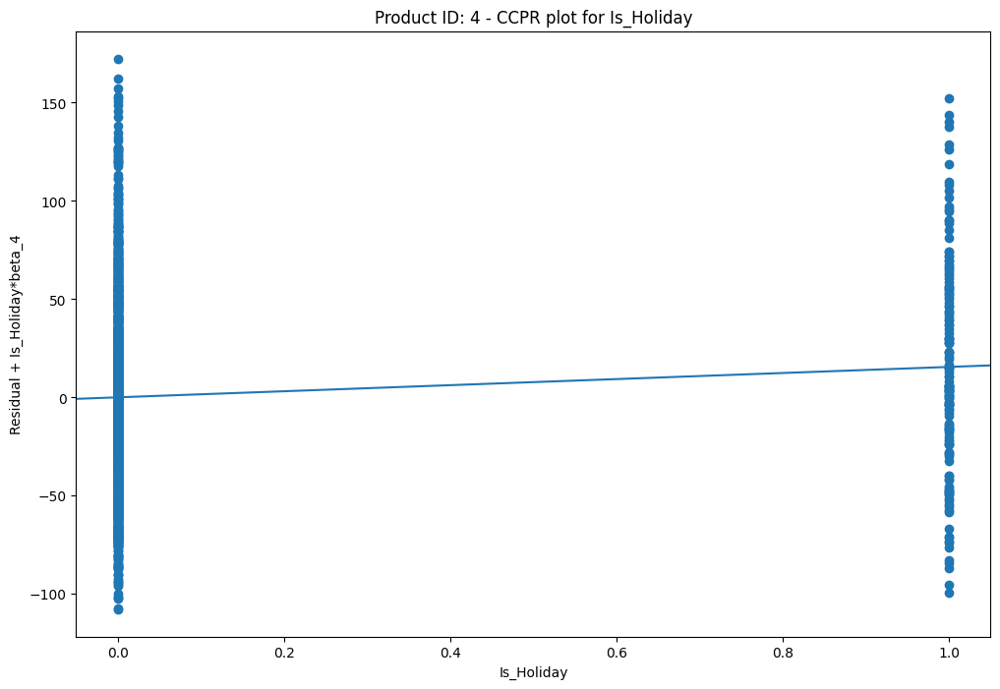

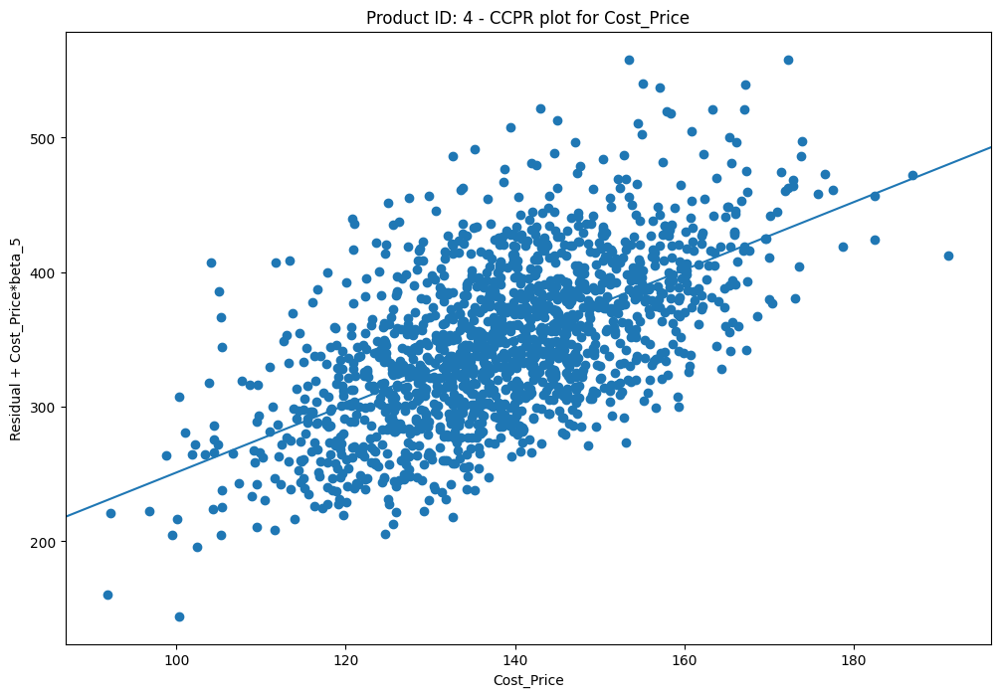

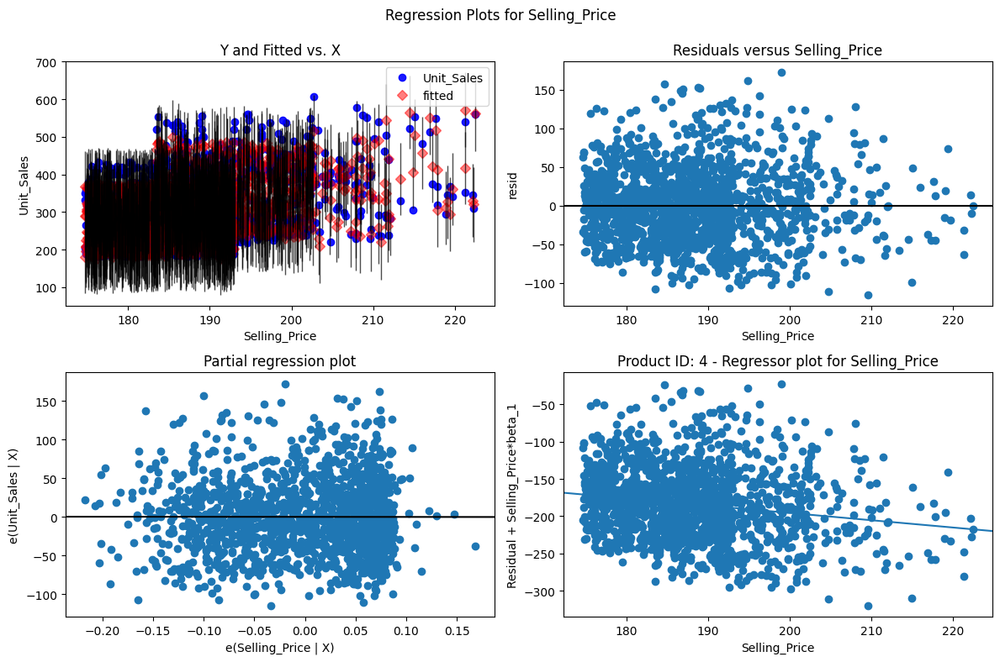

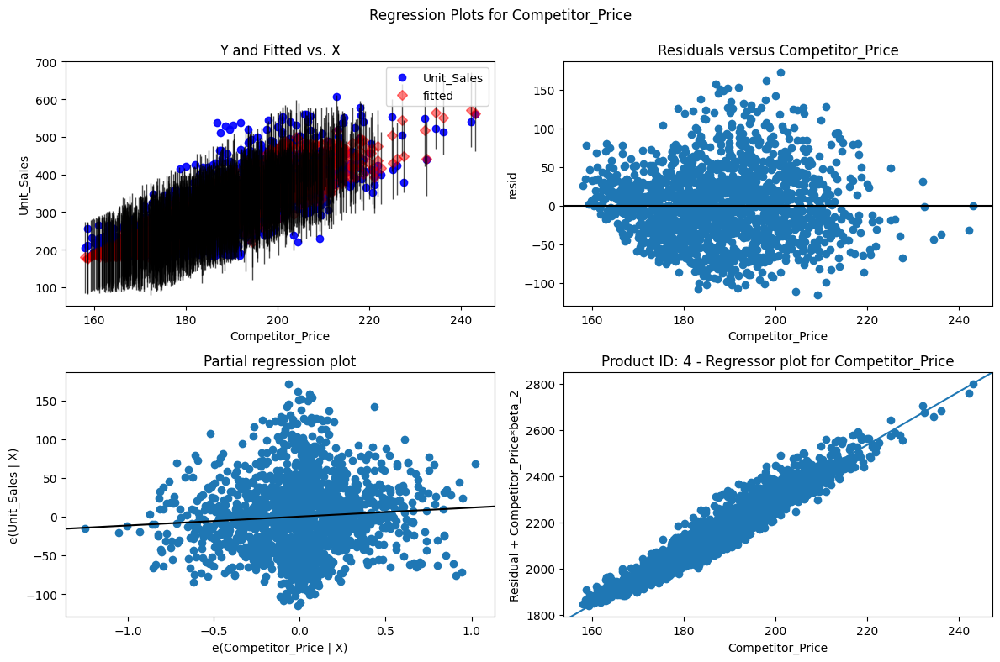

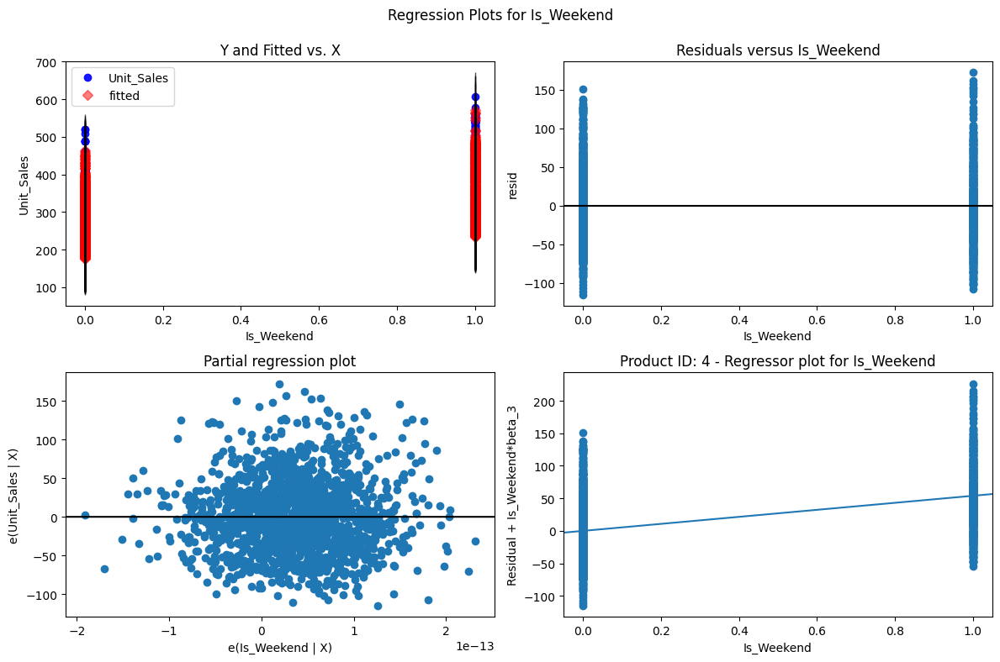

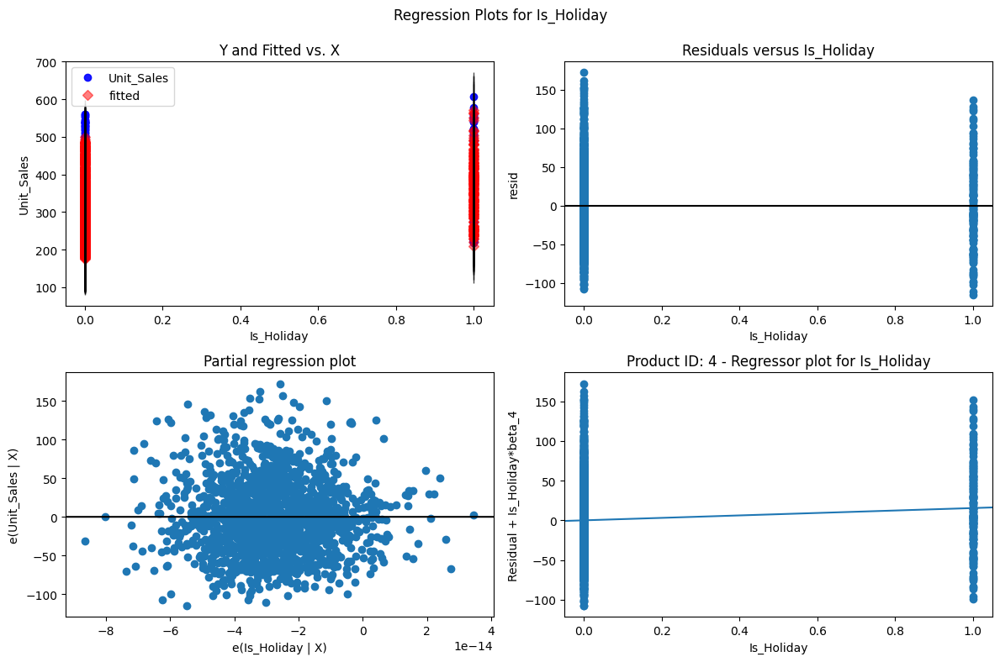

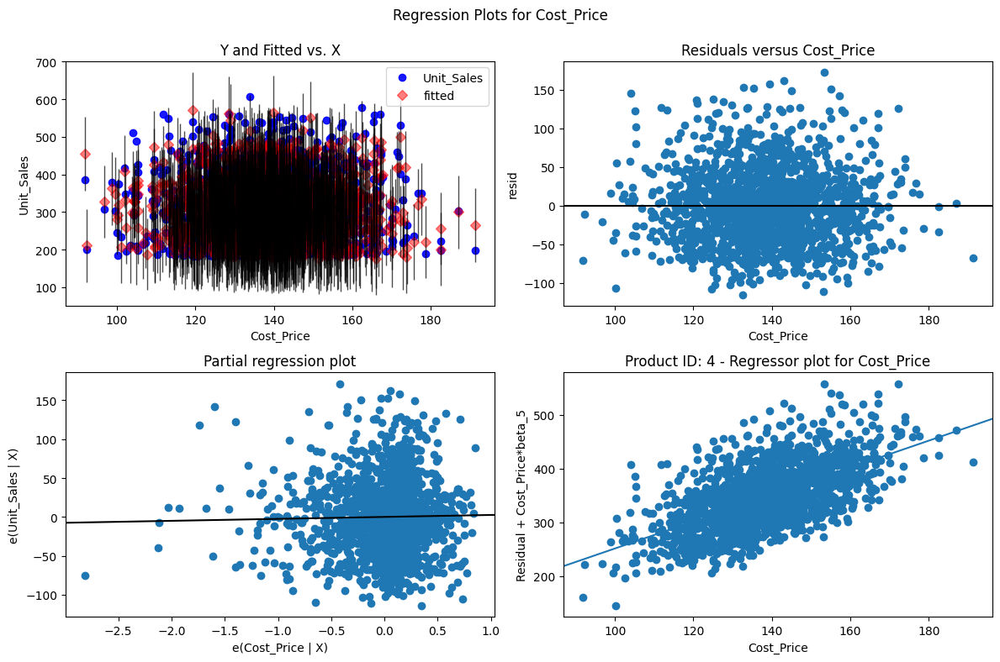

Processing Product_Id: 5

Polynomial Regression Summary for Product_Id 5:
                             OLS Regression Results                            
Dep. Variable:             Unit_Sales   R-squared:                       0.722
Model:                            OLS   Adj. R-squared:                  0.718
Method:                 Least Squares   F-statistic:                     220.8
Date:                Thu, 13 Jun 2024   Prob (F-statistic):               0.00
Time:                        05:53:24   Log-Likelihood:                -8116.9
No. Observations:                1552   AIC:                         1.627e+04
Df Residuals:                    1533   BIC:                         1.637e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

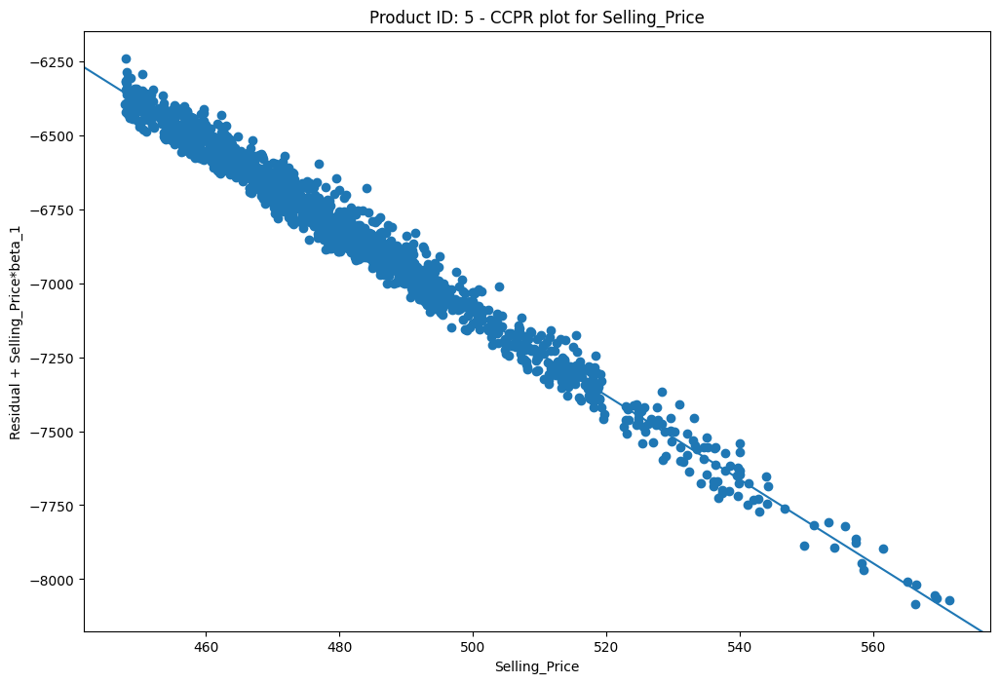

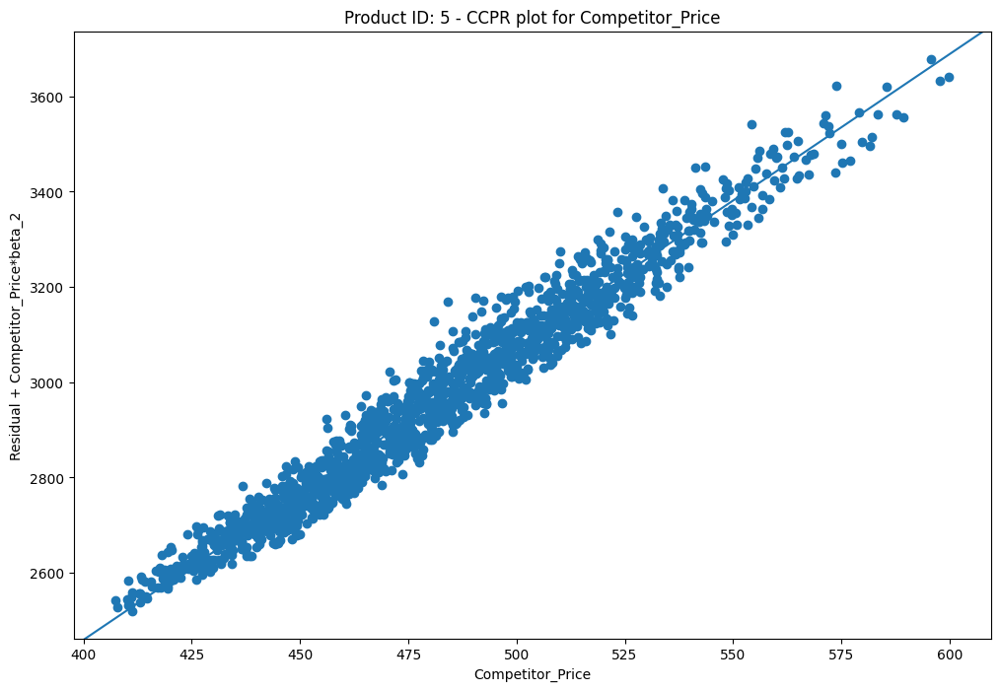

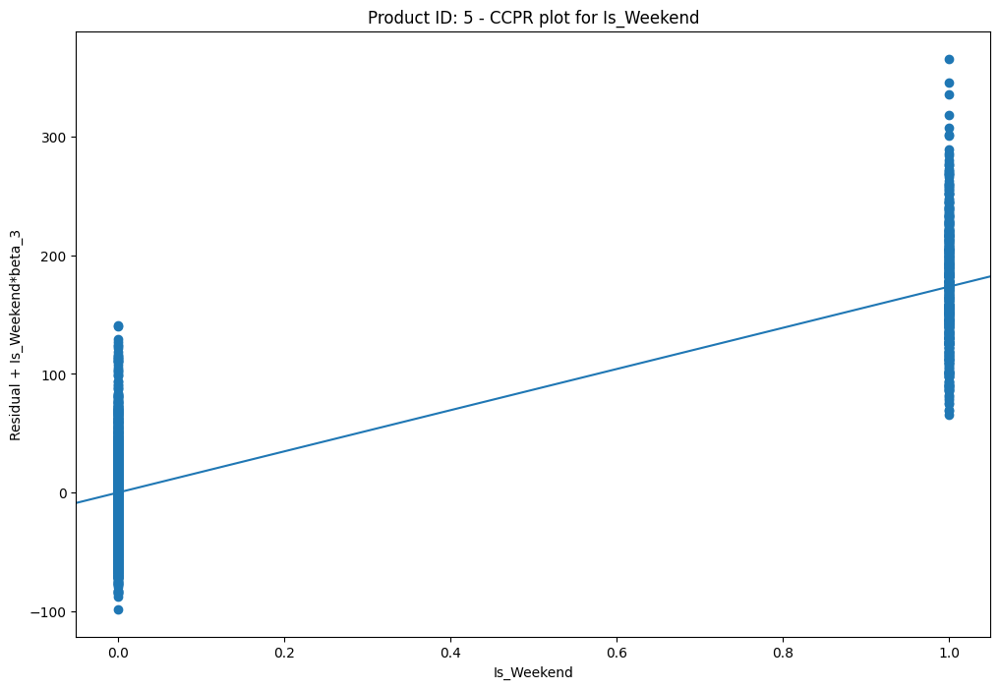

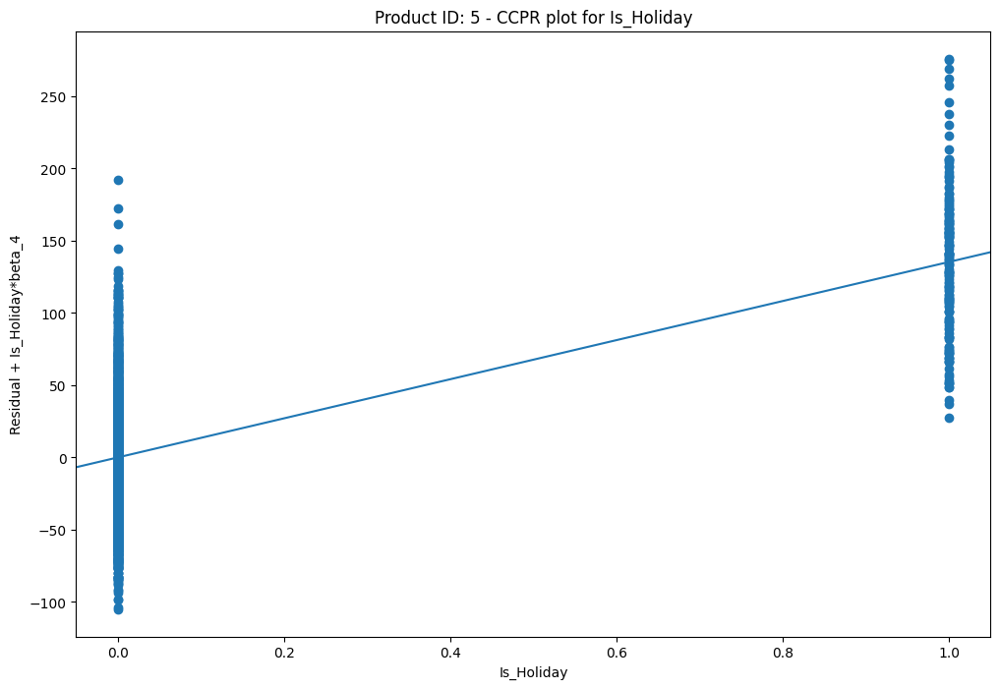

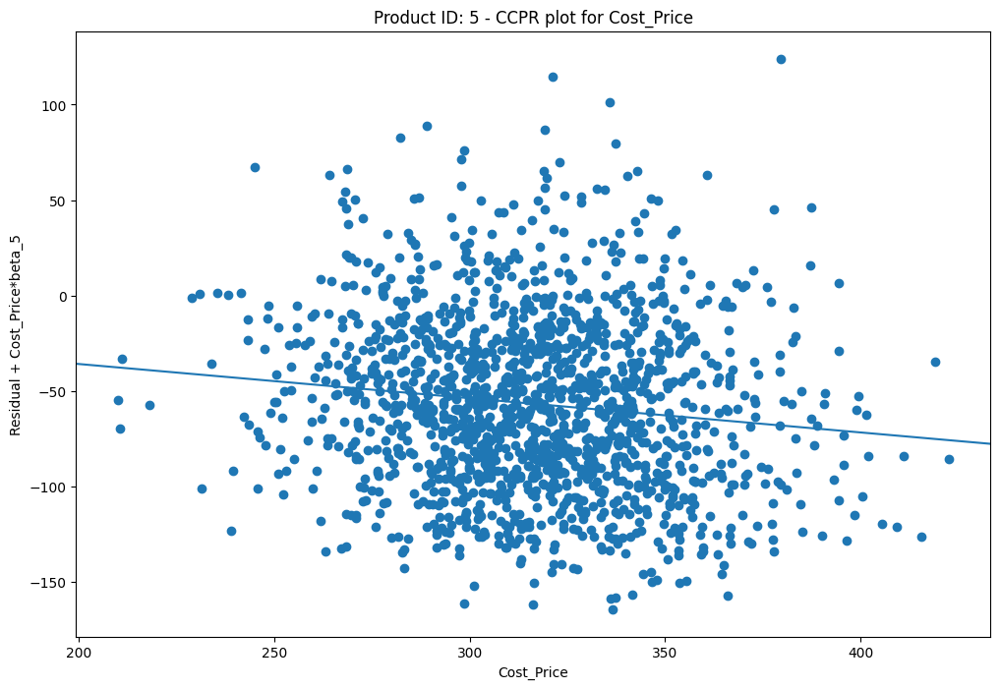

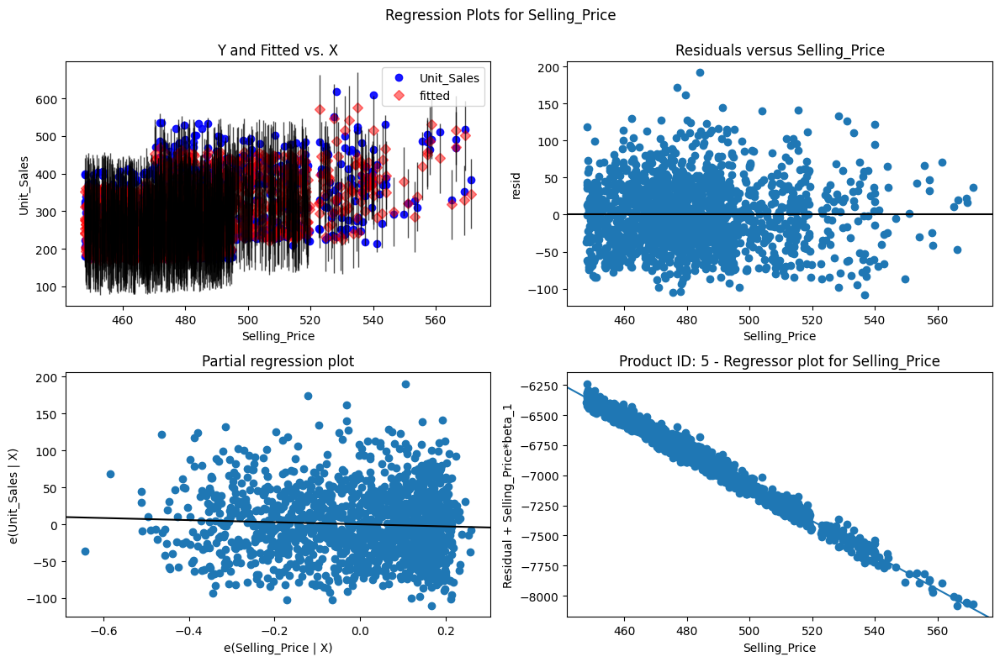

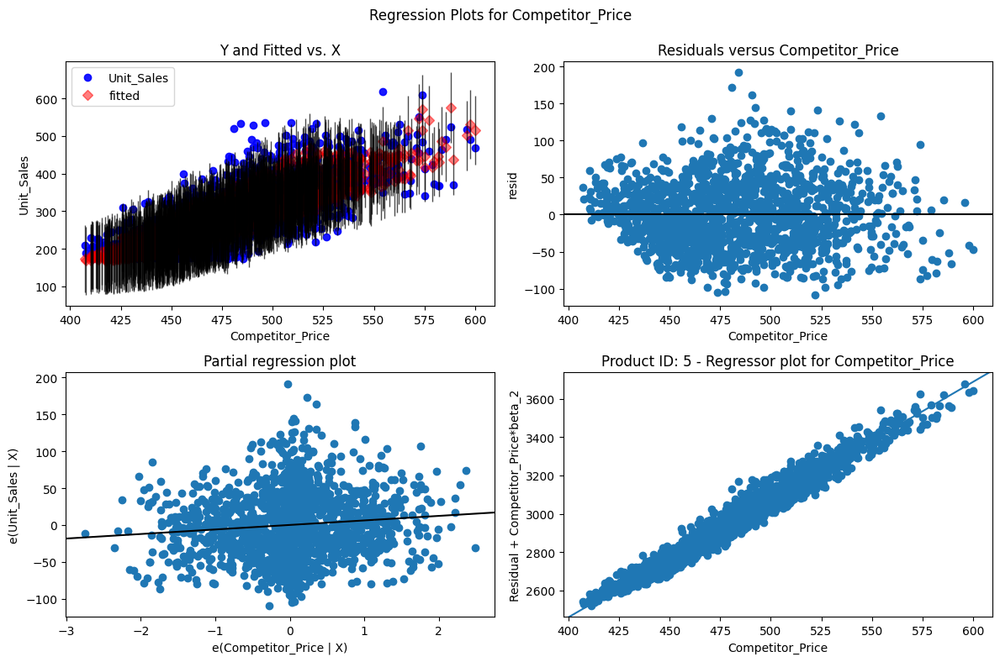

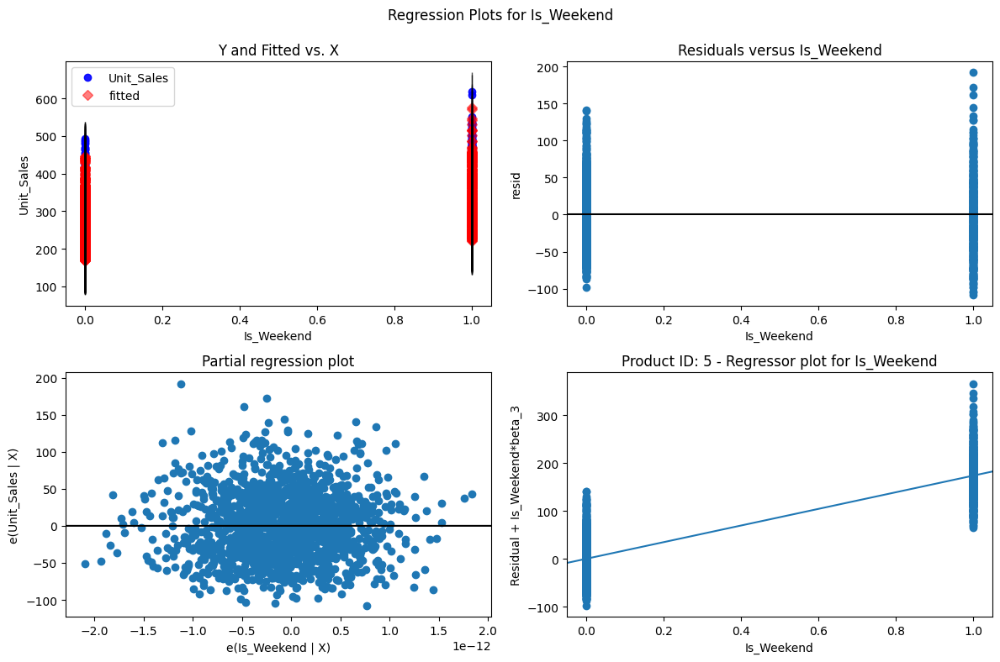

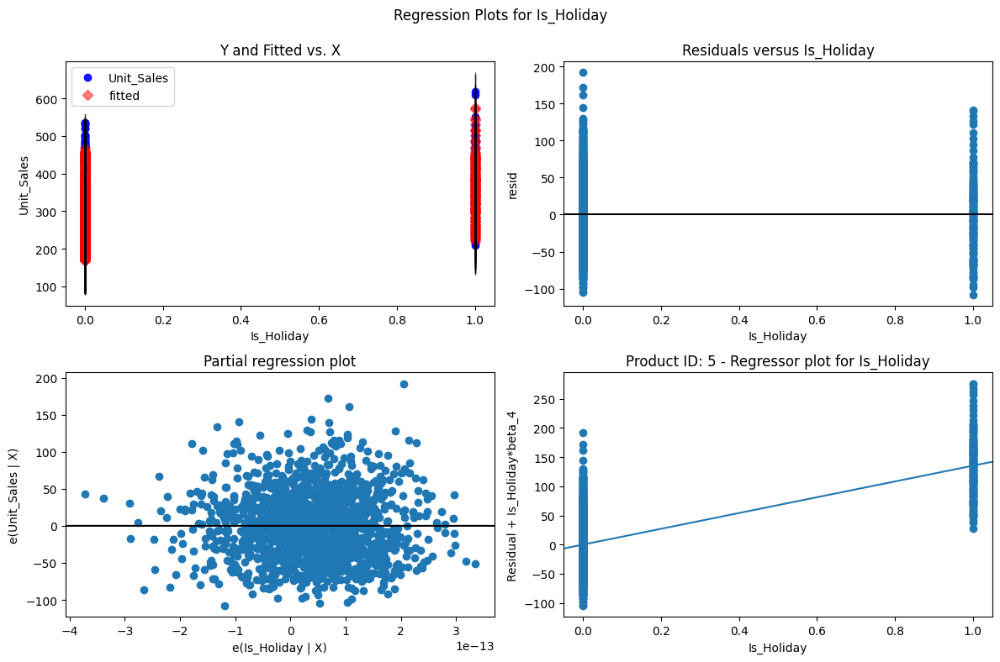

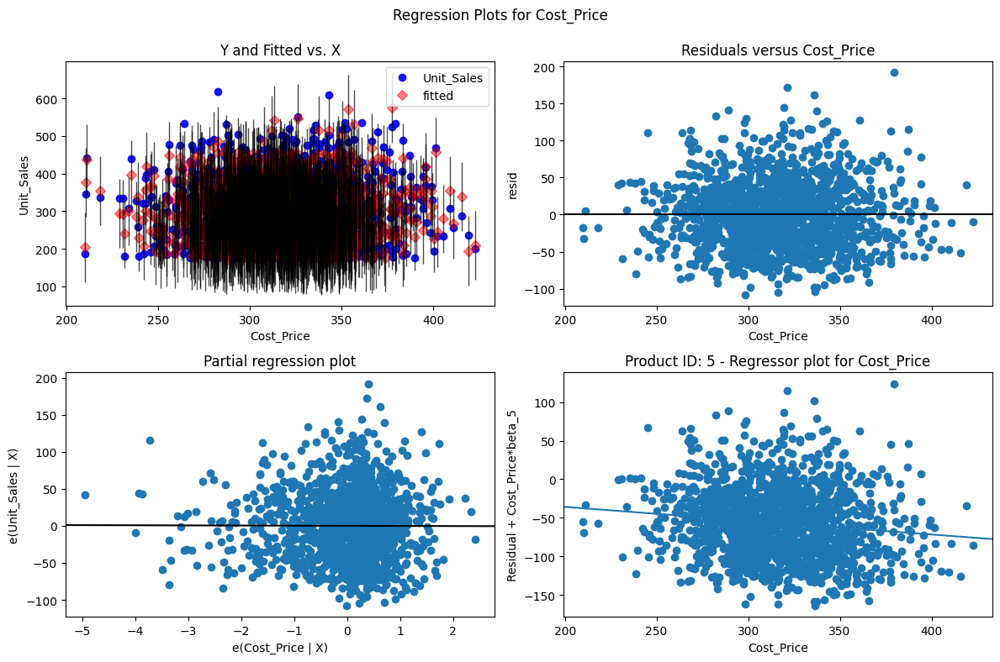

Processing Product_Id: 6

Polynomial Regression Summary for Product_Id 6:
                             OLS Regression Results                            
Dep. Variable:             Unit_Sales   R-squared:                       0.720
Model:                            OLS   Adj. R-squared:                  0.717
Method:                 Least Squares   F-statistic:                     219.4
Date:                Thu, 13 Jun 2024   Prob (F-statistic):               0.00
Time:                        05:53:31   Log-Likelihood:                -9677.5
No. Observations:                1552   AIC:                         1.939e+04
Df Residuals:                    1533   BIC:                         1.949e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

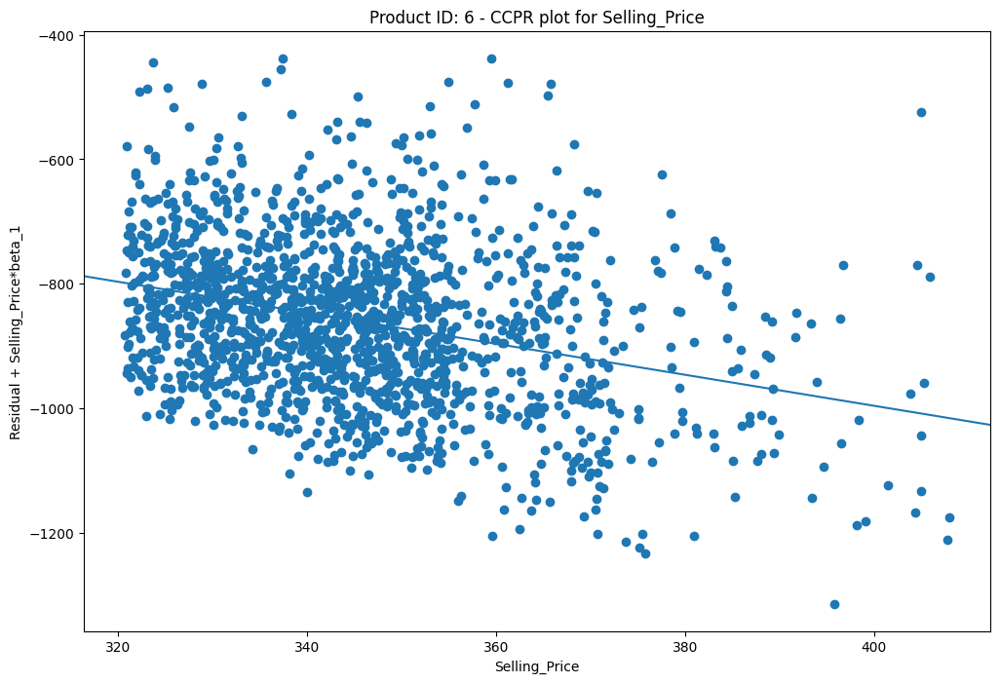

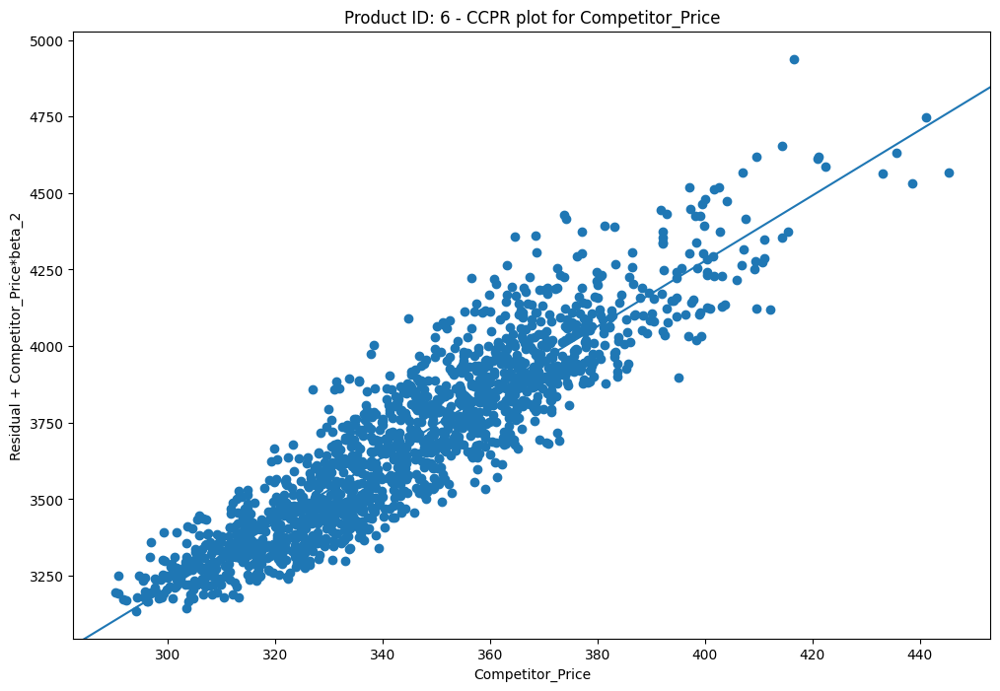

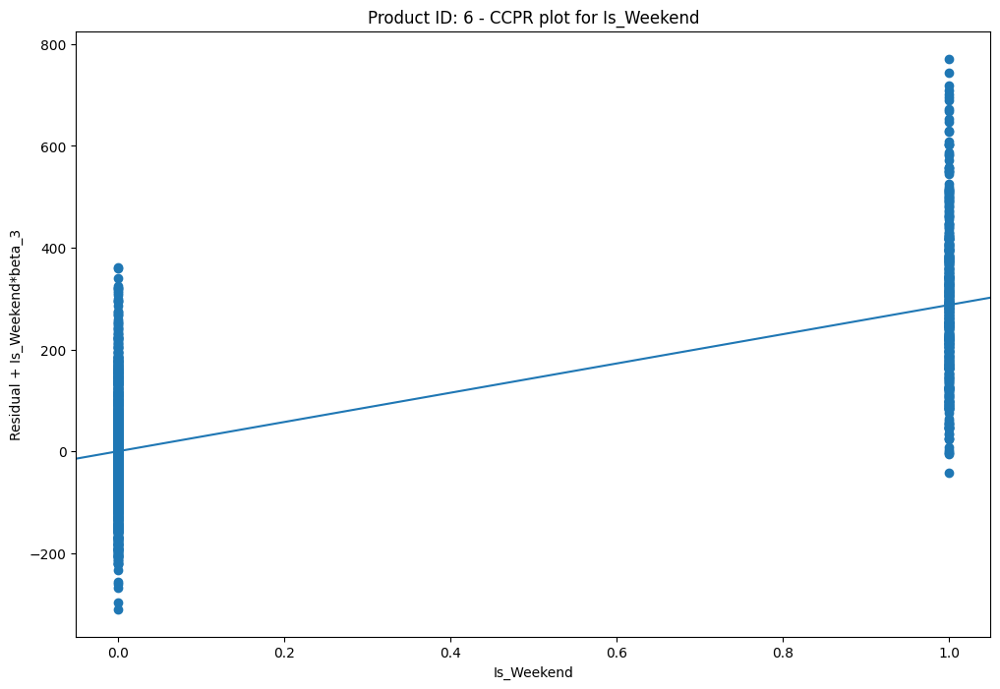

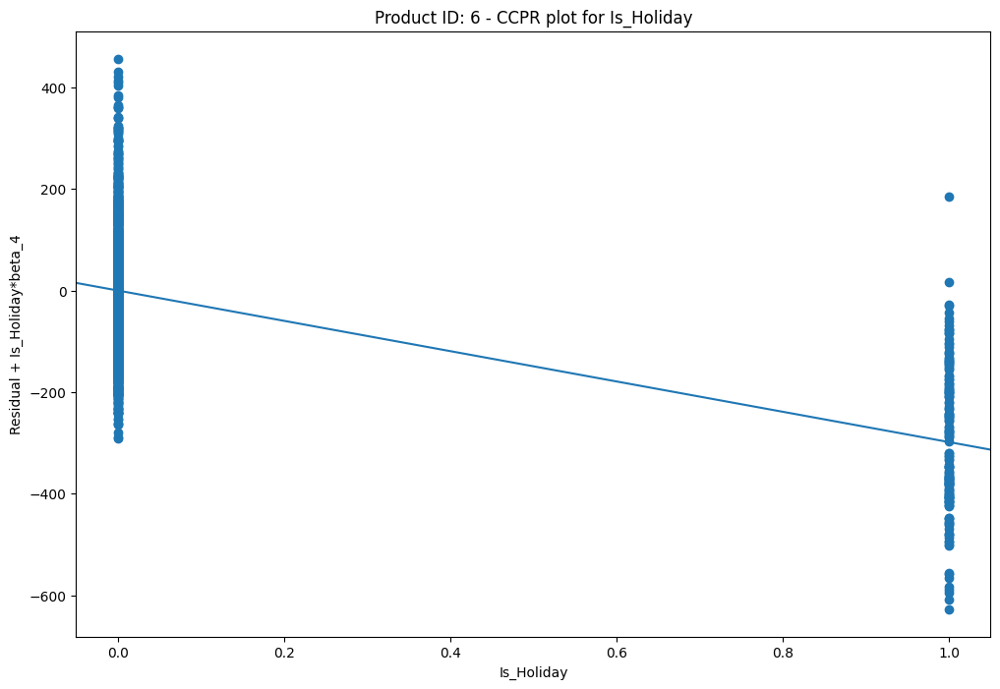

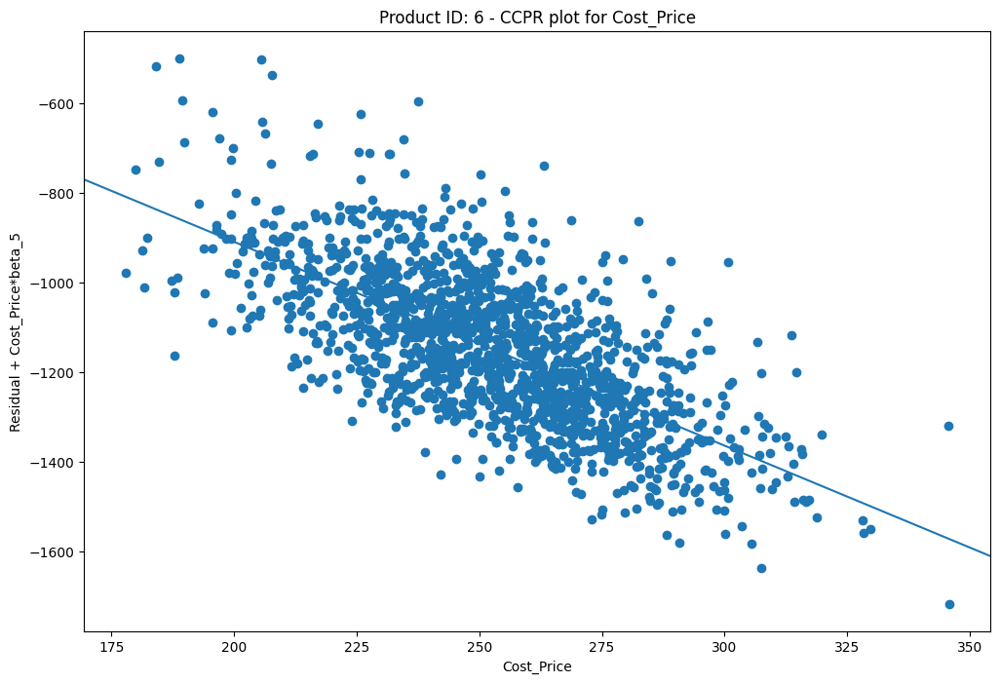

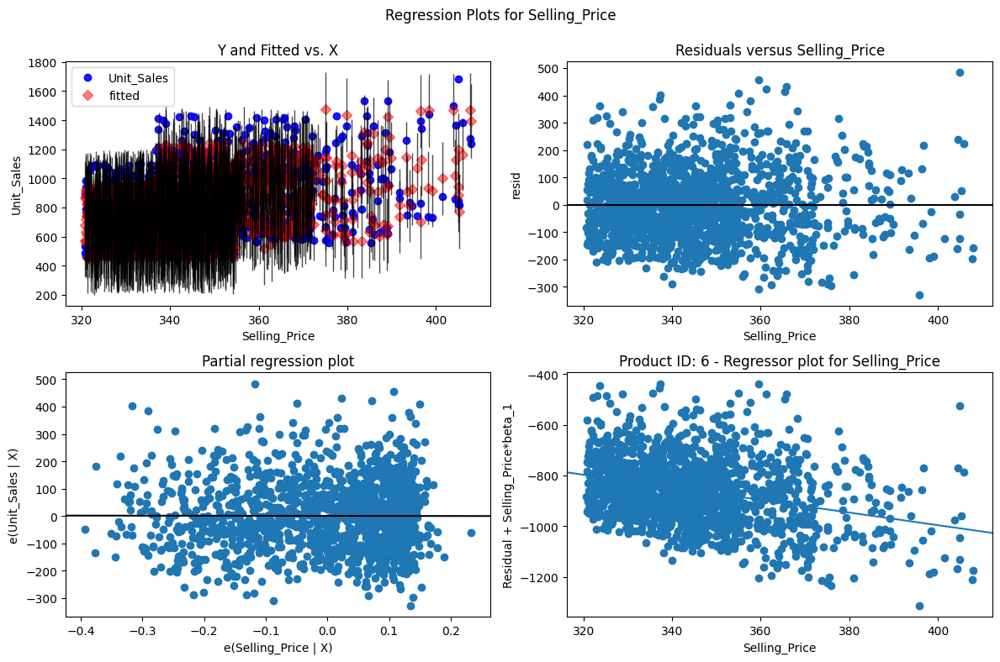

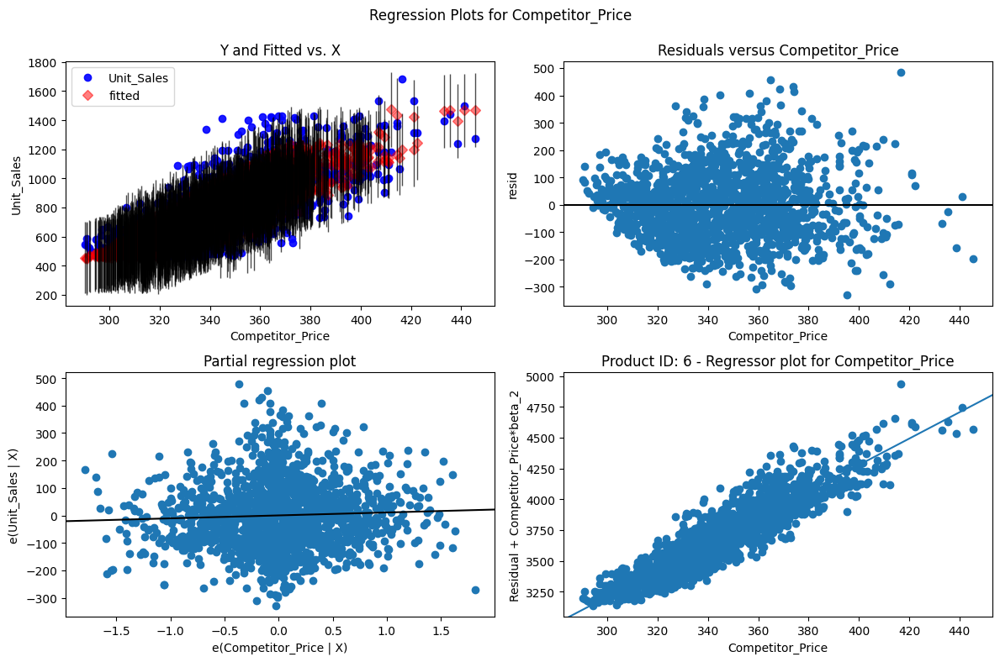

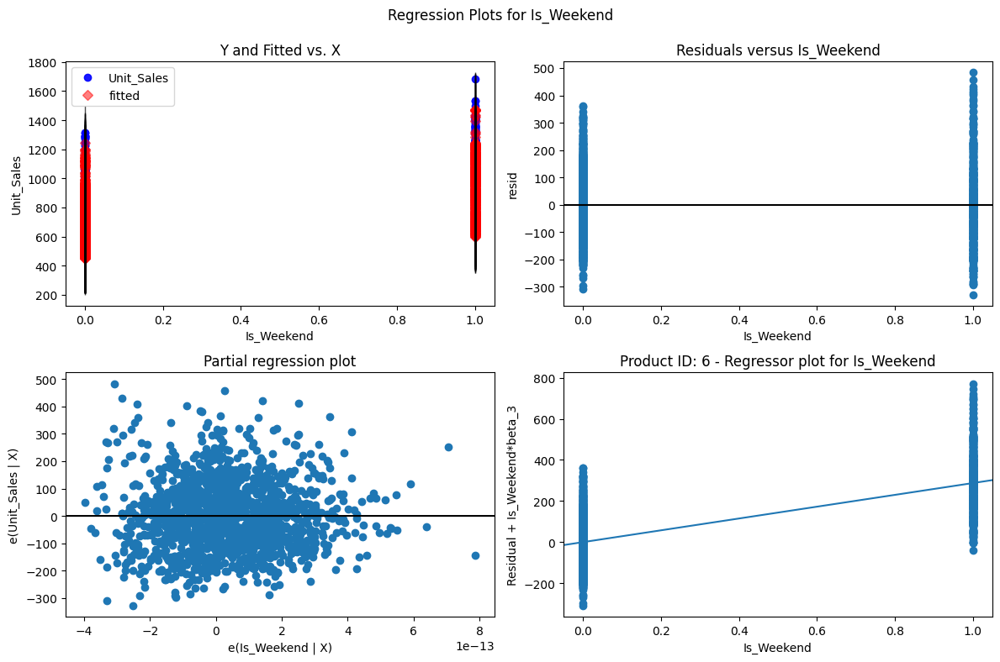

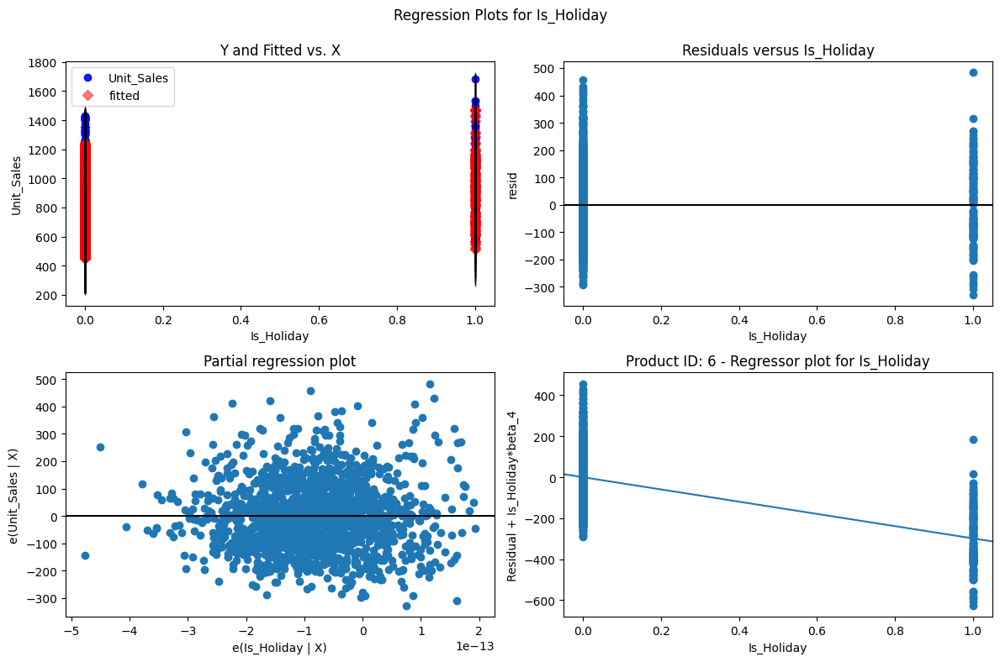

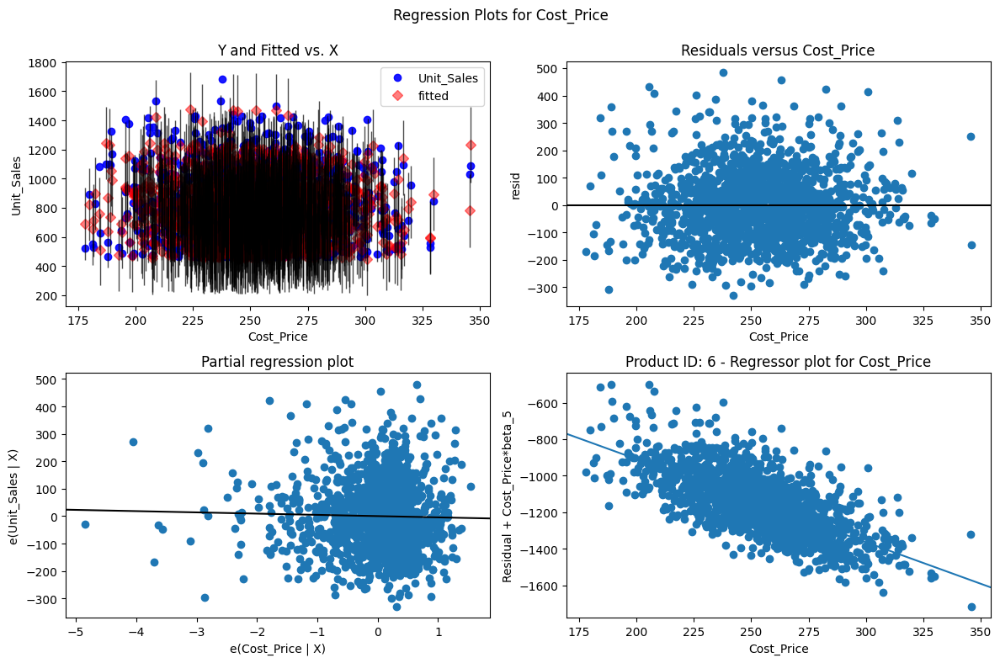

Processing Product_Id: 7

Polynomial Regression Summary for Product_Id 7:
                             OLS Regression Results                            
Dep. Variable:             Unit_Sales   R-squared:                       0.712
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     210.9
Date:                Thu, 13 Jun 2024   Prob (F-statistic):               0.00
Time:                        05:53:38   Log-Likelihood:                -8302.8
No. Observations:                1552   AIC:                         1.664e+04
Df Residuals:                    1533   BIC:                         1.675e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

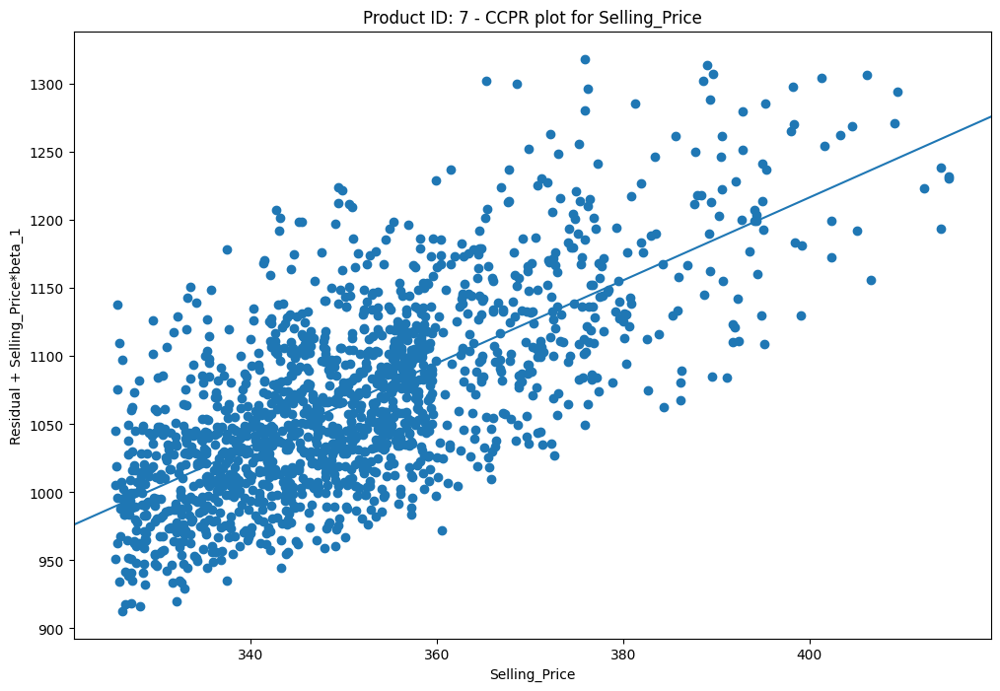

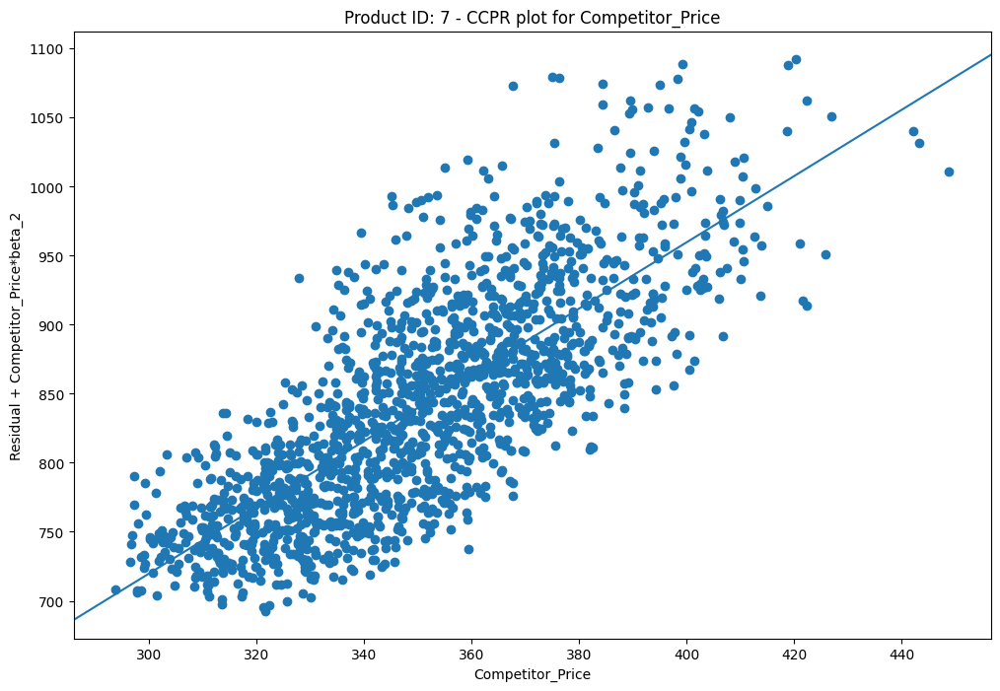

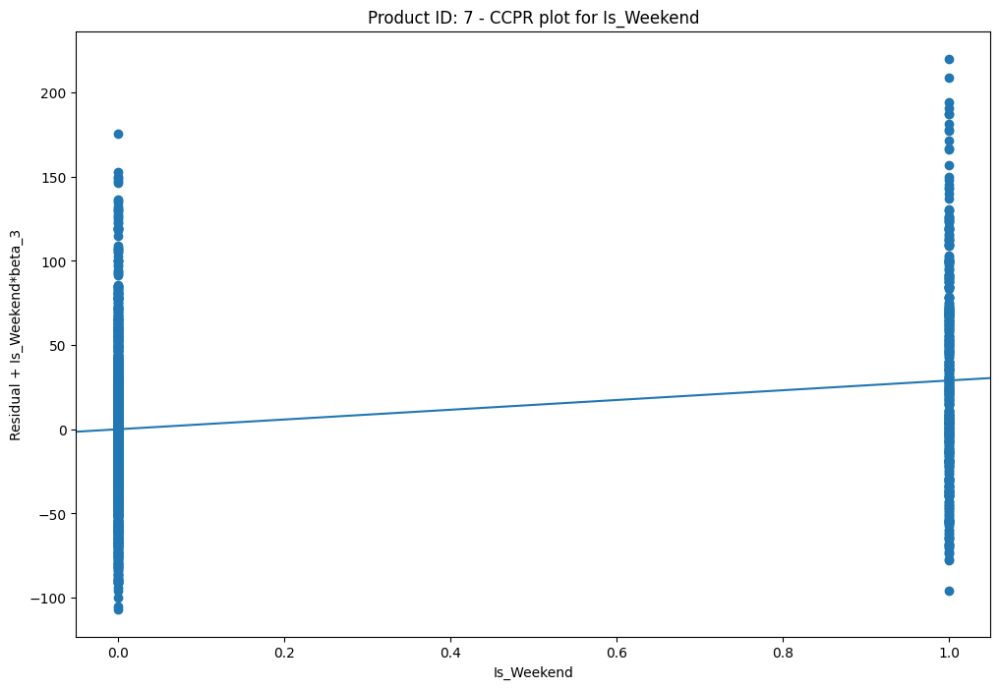

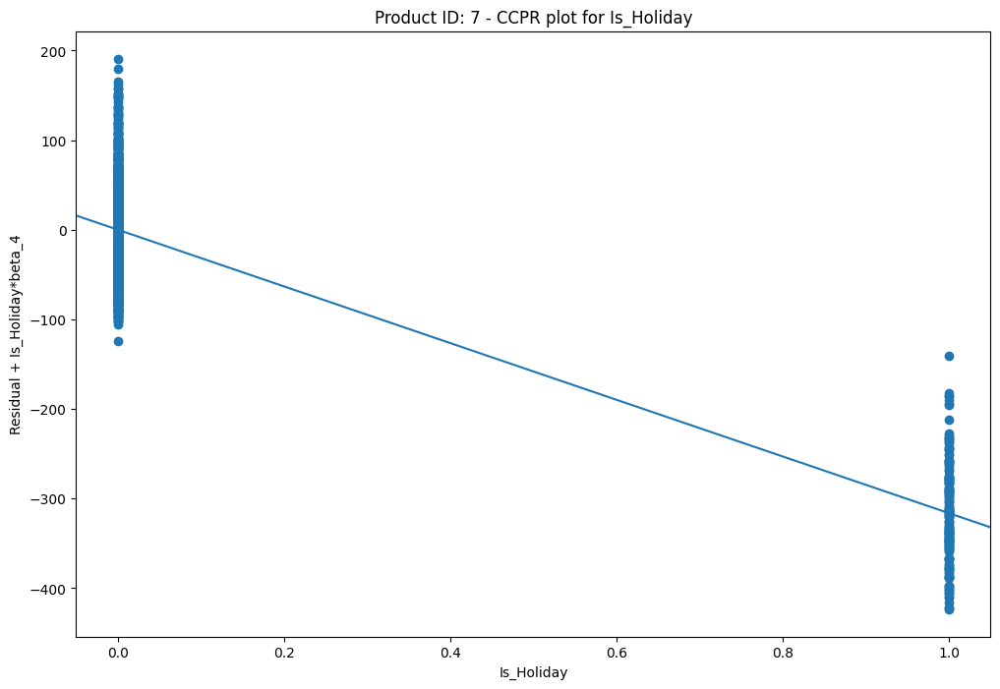

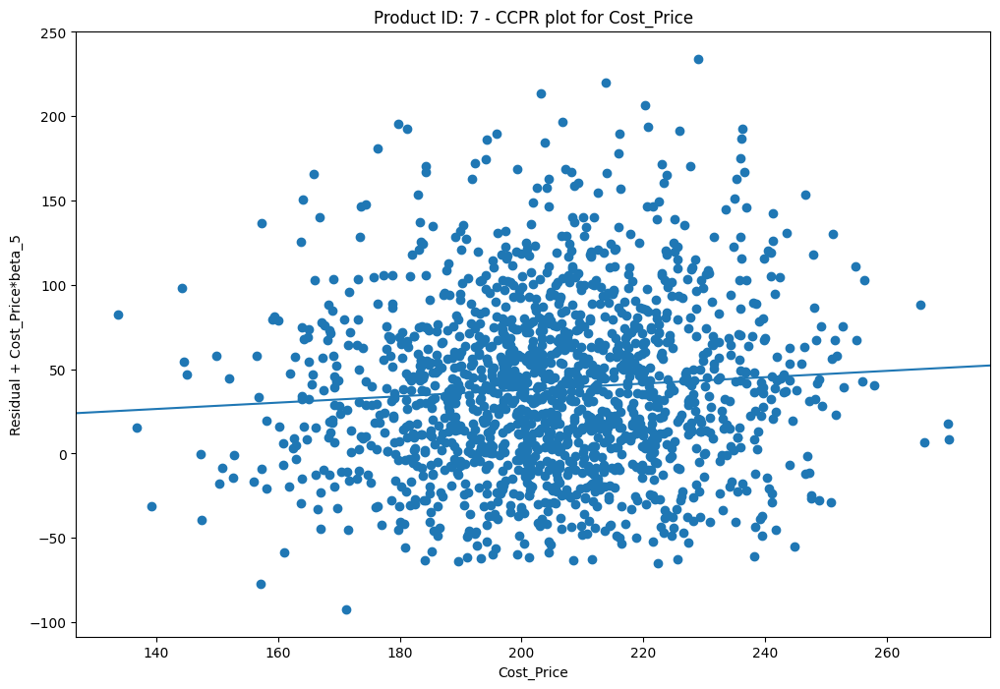

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
import statsmodels.api as sm
import matplotlib.pyplot as plt
# Load the CSV file
file_path = 'final_data.csv'
data = pd.read_csv(file_path)
# Display the first few rows of the data to understand its structure
print(data.head())
# Convert date column to datetime format if it's not already
data['Date'] = pd.to_datetime(data['Date'])
# Sort data by Product_Id and Date
data = data.sort_values(by=['Product_ID', 'Date'])
# Define the predictors and the target variable
predictors = ['Selling_Price', 'Competitor_Price', 'Is_Weekend', 'Is_Holiday', 'Cost_Price']
target = 'Unit_Sales'
# Group the data by Product_Id
grouped_data = data.groupby('Product_ID')
# Initialize dictionaries to store models and summaries
poly_models = {}
poly_summaries = {}
# Loop through each product group to perform polynomial regression
for product_id, group in grouped_data:
   print(f"Processing Product_Id: {product_id}")
   # Extract the predictors and target variable
   X = group[predictors]
   y = group[target]
   # Generate polynomial features
   poly = PolynomialFeatures(degree=2, include_bias=False)
   X_poly = poly.fit_transform(X)
   feature_names = poly.get_feature_names_out(predictors)
   # Fit the polynomial regression model using statsmodels
   X_poly_df = pd.DataFrame(X_poly, columns=feature_names)
   X_poly_df = sm.add_constant(X_poly_df)  # Add an intercept term
   # Ensure indices of y and X_poly_df are aligned
   y = y.reset_index(drop=True)
   X_poly_df = X_poly_df.reset_index(drop=True)
   poly_model = sm.OLS(y, X_poly_df).fit()
   poly_models[product_id] = poly_model
   poly_summaries[product_id] = poly_model.summary()
   # Print the summary for each product (optional)
   print(f"\nPolynomial Regression Summary for Product_Id {product_id}:\n", poly_model.summary())
   # Generate CCPR plots for original predictors
   for predictor in predictors:
       if f'{predictor}' in poly_model.params.index:
           fig, ax = plt.subplots(figsize=(12, 8))
           sm.graphics.plot_ccpr(poly_model, f'{predictor}', ax=ax)
           plt.title(f"Product ID: {product_id} - CCPR plot for {predictor}")
           plt.show()
   # Generate regressor plots for original predictors
   for predictor in predictors:
       if f'{predictor}' in poly_model.params.index:
           fig = plt.figure(figsize=(12, 8))
           fig = sm.graphics.plot_regress_exog(poly_model, f'{predictor}', fig=fig)
           plt.title(f"Product ID: {product_id} - Regressor plot for {predictor}")
           plt.show()
# Optional: Display the summaries for all products
for product_id, summary in poly_summaries.items():
   print(f"\nPolynomial Regression Summary for Product_Id {product_id}:\n", summary)